# Problem set 2 (40 + 36 + 35 = 111 pts)

In this problem set we also present some bonus problems that will be considered as in Problem Set 1.

## Problem 1. Segmentation. (40 pts)
In this task, you will need to solve the problem of semantic segmentation of the attributes of a person's face. You will work with [CelebAMask-HQ](https://github.com/switchablenorms/CelebAMask-HQ) dataset. You are free to solve and implement required steps on your own. However, there are several constraints and advices:
- To speed up and simplify experiments, you can transform images to 512x512 resolution and use this [train-test split](https://drive.google.com/file/d/1vO4mJ08FMdcom2-sNs4WHxPztIRYrFYI/view?usp=share_link), that has smaller number of images.
- (20 pts) Implement needed train-test pipeline (dataset, model, train and test loops), train and test the model. 
  - (10 pts) Bonus: your own model, not taken from libraries and not a Unet.
- (5 pts) Report IoU and Dice-scores of each class on the test set.
- (5 pts) Try to add augmentations (helpful [link1](https://albumentations.ai/) and [link2](https://kornia.github.io/)).
- (2 pts) Plot 4-6 examples of obtained results on the test set (show the best and the worst according to the loss/metrics).
- (3 pts) Explain why you solved the problem this way and not otherwise, provide description of experiments and their results. Analyze your metrics, are they suitable?
- (5 pts) Make additional function for inference that receives path to the image. Test your model on several photos not from the dataset (pick your own photo or any other from internet). Does your model work well on the new data?
- Do not use already pretrained on CelebAMask-HQ models.
- **Bonus**: 
  - **+10 points** for top-1 result
  - **+8 points** for 2-3 places
  - **+5 points** for 4-8 places 
according to reported mean Dice score on the provided test split.

In [1]:
import torch
import os
os.environ["KMP_DUPLICATE_LIB_OK"]="TRUE"
import gdown
from tqdm.notebook import tnrange
from tqdm import tqdm
from torch import nn
import os
import numpy as np
from PIL import Image
from torch.utils.data import Dataset
from torch.utils.data import DataLoader 
import cv2
import random
import torchvision
from torchvision import transforms
import matplotlib.pyplot as plt
import segmentation_models_pytorch as smp
import utils

from torchvision import datasets, transforms
from torch.utils.data import Dataset, DataLoader
from torchvision.io import read_image
import concurrent.futures
from sklearn.metrics import confusion_matrix

device = torch.device("cuda:3" if torch.cuda.is_available() else "cpu")
print(device)

cuda:3


### Data downloading & pre-process

In [2]:
df, files = utils.downloading_tts()
utils.make_tts(df, files)
utils.make_mask('CelebAMask-HQ/CelebAMask-HQ-mask-anno', 'train_img_mask', 'train_img')
utils.make_mask('CelebAMask-HQ/CelebAMask-HQ-mask-anno', 'test_img_mask', 'test_img')

Downloading...
From: https://drive.google.com/uc?id=1vO4mJ08FMdcom2-sNs4WHxPztIRYrFYI
To: /home/d_sherki/DL/hw2/celeb_train_test_split.csv
100%|██████████████████████████████████████| 74.4k/74.4k [00:00<00:00, 2.09MB/s]


,name,is_train
0,28929.jpg,True
1,1741.jpg,True
2,11349.jpg,True
3,14782.jpg,True
4,2129.jpg,True
...,...,...
4995,7297.jpg,False
4996,1999.jpg,False
4997,3802.jpg,False
4998,9292.jpg,False


  0%|          | 0/30000 [00:00<?, ?it/s]

  0%|          | 0/3750 [00:00<?, ?it/s]

CelebAMask-HQ/CelebAMask-HQ-mask-anno/8/17689_skin.png
CelebAMask-HQ/CelebAMask-HQ-mask-anno/8/17689_nose.png
CelebAMask-HQ/CelebAMask-HQ-mask-anno/8/17689_eye_g.png
CelebAMask-HQ/CelebAMask-HQ-mask-anno/8/17689_l_eye.png
CelebAMask-HQ/CelebAMask-HQ-mask-anno/8/17689_r_eye.png
CelebAMask-HQ/CelebAMask-HQ-mask-anno/8/17689_l_brow.png
CelebAMask-HQ/CelebAMask-HQ-mask-anno/8/17689_r_brow.png
CelebAMask-HQ/CelebAMask-HQ-mask-anno/8/17689_l_ear.png
CelebAMask-HQ/CelebAMask-HQ-mask-anno/8/17689_r_ear.png
CelebAMask-HQ/CelebAMask-HQ-mask-anno/8/17689_mouth.png
CelebAMask-HQ/CelebAMask-HQ-mask-anno/8/17689_u_lip.png
CelebAMask-HQ/CelebAMask-HQ-mask-anno/8/17689_l_lip.png
CelebAMask-HQ/CelebAMask-HQ-mask-anno/8/17689_hair.png
CelebAMask-HQ/CelebAMask-HQ-mask-anno/8/17689_hat.png
CelebAMask-HQ/CelebAMask-HQ-mask-anno/8/17689_ear_r.png
CelebAMask-HQ/CelebAMask-HQ-mask-anno/8/17689_neck_l.png
CelebAMask-HQ/CelebAMask-HQ-mask-anno/8/17689_neck.png
CelebAMask-HQ/CelebAMask-HQ-mask-anno/8/17689_cloth

  0%|          | 0/1250 [00:00<?, ?it/s]

CelebAMask-HQ/CelebAMask-HQ-mask-anno/9/19853_skin.png
CelebAMask-HQ/CelebAMask-HQ-mask-anno/9/19853_nose.png
CelebAMask-HQ/CelebAMask-HQ-mask-anno/9/19853_eye_g.png
CelebAMask-HQ/CelebAMask-HQ-mask-anno/9/19853_l_eye.png
CelebAMask-HQ/CelebAMask-HQ-mask-anno/9/19853_r_eye.png
CelebAMask-HQ/CelebAMask-HQ-mask-anno/9/19853_l_brow.png
CelebAMask-HQ/CelebAMask-HQ-mask-anno/9/19853_r_brow.png
CelebAMask-HQ/CelebAMask-HQ-mask-anno/9/19853_l_ear.png
CelebAMask-HQ/CelebAMask-HQ-mask-anno/9/19853_r_ear.png
CelebAMask-HQ/CelebAMask-HQ-mask-anno/9/19853_mouth.png
CelebAMask-HQ/CelebAMask-HQ-mask-anno/9/19853_u_lip.png
CelebAMask-HQ/CelebAMask-HQ-mask-anno/9/19853_l_lip.png
CelebAMask-HQ/CelebAMask-HQ-mask-anno/9/19853_hair.png
CelebAMask-HQ/CelebAMask-HQ-mask-anno/9/19853_hat.png
CelebAMask-HQ/CelebAMask-HQ-mask-anno/9/19853_ear_r.png
CelebAMask-HQ/CelebAMask-HQ-mask-anno/9/19853_neck_l.png
CelebAMask-HQ/CelebAMask-HQ-mask-anno/9/19853_neck.png
CelebAMask-HQ/CelebAMask-HQ-mask-anno/9/19853_cloth

### (20 pts) Implement needed train-test pipeline (dataset, model, train and test loops), train and test the model.

In [2]:
# class Dataset

class CelebAMaskHQDataset(Dataset):
    '''
    This is class Dataset, which take images from "train_img", "train_img_mask"
    "test_img","test_img_mask" and 
    Inspiration from provided dataset dithub.
    '''
    def __init__(self, train=True, transform=None):
        self.transform = transform
        self.train = train

        if self.train:
            self.img_dir = 'train_img'
            self.mask_dir = 'train_img_mask'
        else:
            self.img_dir = 'test_img'
            self.mask_dir = 'test_img_mask'
    
        self.img_paths = sorted([os.path.join(self.img_dir, f) for f in os.listdir(self.img_dir)])
        self.mask_paths = sorted([os.path.join(self.mask_dir, f.replace('.jpg', '.png')) for f in os.listdir(self.img_dir)])

    def __len__(self):
        return len(self.img_paths)

    def __getitem__(self, idx):
        # Load the image and mask at the specified index
        img_path = self.img_paths[idx]
        mask_path = self.mask_paths[idx]
        
        with concurrent.futures.ThreadPoolExecutor() as executor:
            future_img = executor.submit(read_image, img_path)
            future_mask = executor.submit(read_image, mask_path)

            img = future_img.result().float() / 255.
            mask = future_mask.result().squeeze().long()

        if self.transform is not None:
            img, mask = self.transform(img), self.transform(mask)

        classes = torch.unique(mask)
        mask = mask
        
        return img, mask

In [3]:
# # model, train loop, test loop

model = smp.Unet(
    encoder_name="resnet18",     # choose encoder, e.g. mobilenet_v2 or efficientnet-b7
    encoder_weights="imagenet",     # use `imagenet` pre-trained weights for encoder initialization
    in_channels=3,                  # model input channels (1 for gray-scale images, 3 for RGB, etc.)
    classes=19,                      # model output channels (number of classes in your dataset)
    activation = 'softmax2d'
).to(device)

def train(model, optimizer, criterion, n_epochs, model_name = 'model'):
    train_loss_epoch = []
    val_loss_epoch = []
    min_val_loss = np.inf

    for epoch in tqdm(range(n_epochs)):
        train_loss_batch = []
        val_loss_batch = []
        model.train()
        for i, (images, targets) in enumerate(train_loader):
            optimizer.zero_grad()

            images = images.to(device)
            targets = targets.to(device, dtype=torch.int64)
            outputs = model(images)
            loss = criterion(outputs, targets)
            train_loss_batch.append(loss.item())
            loss.backward()
            optimizer.step()

            if (i+1) % 500 == 0:
                print(f'epoch [{epoch}/{n_epochs}], step [{i+1}/{len(train_loader)}], train loss: {loss.item():.4f}')

    
        model.eval()
        for i, (images, targets) in enumerate(test_loader):

            images = images.to(device)
            targets = targets.to(device, dtype=torch.int64)
            outputs = model(images)
            loss = criterion(outputs, targets)
            val_loss_batch.append(loss.item())
            
            if (i+1) % 250 == 0:
                print(f'epoch [{epoch}/{n_epochs}], step [{i+1}/{len(test_loader)}], val loss: {loss.item():.4f}')

        train_loss_epoch.append(np.mean(train_loss_batch))
        val_loss_epoch.append(np.mean(val_loss_batch))
        if val_loss_epoch[-1] < min_val_loss:
            min_val_loss = val_loss_epoch[-1]
            torch.save(model.state_dict(), f'{model_name}.pth')
        print(f'epoch: {epoch}, train loss for epoch {np.mean(train_loss_batch)}, val loss for epoch {np.mean(val_loss_batch)}')
    
    return [train_loss_epoch, val_loss_epoch, train_loss_batch, val_loss_batch]

In [6]:
from segmentation_models_pytorch.losses import FocalLoss

In [21]:
device = torch.device("cuda:3" if torch.cuda.is_available() else "cpu")
print(device)

n_epochs = 20
learning_rate = 0.0003

model = smp.Unet(
    encoder_name="resnet18",     # choose encoder, e.g. mobilenet_v2 or efficientnet-b7
    encoder_weights="imagenet",     # use `imagenet` pre-trained weights for encoder initialization
    in_channels=3,                  # model input channels (1 for gray-scale images, 3 for RGB, etc.)
    classes=19,                      # model output channels (number of classes in your dataset)
    activation = 'softmax2d'
).to(device)

# criterion = nn.CrossEntropyLoss()
criterion = FocalLoss('multiclass')
# criterion = DiceLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)

train_data = CelebAMaskHQDataset(train=True)
test_data = CelebAMaskHQDataset(train=False)

batch_size = 4
train_loader = DataLoader(train_data, batch_size=batch_size, shuffle=True)
test_loader = DataLoader(test_data, batch_size=batch_size, shuffle=False)

logging = train(model, optimizer, criterion, n_epochs, model_name='models/unet_smp_v3_FL')
np.save('log_unet_v3_FL.npy', logging)

cuda:3


  0%|                                                    | 0/20 [00:00<?, ?it/s]

epoch [0/20], step [500/938], train loss: 3.2818
epoch [0/20], step [250/313], val loss: 3.2219


  5%|██                                       | 1/20 [03:53<1:13:51, 233.25s/it]

epoch [1/20], step [500/938], train loss: 3.1892
epoch [1/20], step [250/313], val loss: 3.2072


 10%|████                                     | 2/20 [07:45<1:09:49, 232.76s/it]

epoch [2/20], step [500/938], train loss: 3.1848
epoch [2/20], step [250/313], val loss: 3.2012


 15%|██████▏                                  | 3/20 [11:39<1:06:01, 233.05s/it]

epoch [3/20], step [500/938], train loss: 3.1931
epoch [3/20], step [250/313], val loss: 3.1892


 20%|████████▏                                | 4/20 [15:34<1:02:22, 233.90s/it]

epoch [4/20], step [500/938], train loss: 3.1782
epoch [4/20], step [250/313], val loss: 3.1721


 25%|██████████▊                                | 5/20 [19:28<58:28, 233.89s/it]

epoch [5/20], step [500/938], train loss: 3.1872
epoch [5/20], step [250/313], val loss: 3.2031


 30%|████████████▉                              | 6/20 [23:22<54:34, 233.91s/it]

epoch [6/20], step [500/938], train loss: 3.1875
epoch [6/20], step [250/313], val loss: 3.1752


 35%|███████████████                            | 7/20 [27:16<50:43, 234.08s/it]

epoch [7/20], step [500/938], train loss: 3.1673
epoch [7/20], step [250/313], val loss: 3.1980


 40%|█████████████████▏                         | 8/20 [31:08<46:42, 233.53s/it]

epoch [8/20], step [500/938], train loss: 3.1747
epoch [8/20], step [250/313], val loss: 3.2099


 45%|███████████████████▎                       | 9/20 [35:20<43:50, 239.11s/it]

epoch [9/20], step [500/938], train loss: 3.1806
epoch [9/20], step [250/313], val loss: 3.1900


 50%|█████████████████████                     | 10/20 [40:21<43:03, 258.32s/it]

epoch [10/20], step [500/938], train loss: 3.1737
epoch [10/20], step [250/313], val loss: 3.1763


 55%|███████████████████████                   | 11/20 [46:07<42:45, 285.01s/it]

epoch [11/20], step [500/938], train loss: 3.1689
epoch [11/20], step [250/313], val loss: 3.2016


 60%|█████████████████████████▏                | 12/20 [51:38<39:52, 299.06s/it]

epoch [12/20], step [500/938], train loss: 3.1667
epoch [12/20], step [250/313], val loss: 3.1824


 65%|███████████████████████████▎              | 13/20 [56:12<34:01, 291.58s/it]

epoch [13/20], step [500/938], train loss: 3.1727
epoch [13/20], step [250/313], val loss: 3.2075


 70%|█████████████████████████████▍            | 14/20 [59:46<26:47, 267.99s/it]

epoch [14/20], step [500/938], train loss: 3.1887
epoch [14/20], step [250/313], val loss: 3.1927


 75%|██████████████████████████████          | 15/20 [1:03:09<20:42, 248.52s/it]

epoch [15/20], step [500/938], train loss: 3.1643
epoch [15/20], step [250/313], val loss: 3.1942


 80%|████████████████████████████████        | 16/20 [1:06:33<15:40, 235.02s/it]

epoch [16/20], step [500/938], train loss: 3.1695
epoch [16/20], step [250/313], val loss: 3.2119


 85%|██████████████████████████████████      | 17/20 [1:09:56<11:16, 225.43s/it]

epoch [17/20], step [500/938], train loss: 3.1923
epoch [17/20], step [250/313], val loss: 3.1893


 90%|████████████████████████████████████    | 18/20 [1:13:19<07:17, 218.77s/it]

epoch [18/20], step [500/938], train loss: 3.1620
epoch [18/20], step [250/313], val loss: 3.1933


 95%|██████████████████████████████████████  | 19/20 [1:16:41<03:33, 213.74s/it]

epoch [19/20], step [500/938], train loss: 3.1606
epoch [19/20], step [250/313], val loss: 3.1871


100%|████████████████████████████████████████| 20/20 [1:20:05<00:00, 240.27s/it]
/home/d_sherki/anaconda3/lib/python3.9/site-packages/numpy/lib/npyio.py:528: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.asanyarray(arr)


In [22]:
model = smp.Unet(
    encoder_name="resnet18",     # choose encoder, e.g. mobilenet_v2 or efficientnet-b7
    encoder_weights="imagenet",     # use `imagenet` pre-trained weights for encoder initialization
    in_channels=3,                  # model input channels (1 for gray-scale images, 3 for RGB, etc.)
    classes=19,                      # model output channels (number of classes in your dataset)
    activation = 'softmax2d'
).to(device)

model.load_state_dict(torch.load('models/unet_smp_v3_FL.pth', map_location=torch.device("cpu")))

<All keys matched successfully>

In [23]:
def predict(img, model = model):
    model.eval()
    output = model(img.to(device))
    pred = output.argmax(dim=1)

    return pred.squeeze().detach().cpu().numpy()

def result_example(log_file_path,  test_loader = test_loader):
    logging = np.load(log_file_path, allow_pickle=True)
    plt.figure(figsize=(12,6))
    plt.plot(logging[0], label="Train CrossEntropy Loss")
    plt.plot(logging[1], label="Test CrossEntropy Loss")
    plt.legend()
    plt.show()
    
    image, target = next(iter(test_loader))
    plt.figure(figsize=(12,6))
    plt.subplot(131)
    plt.imshow(image[0].permute(1,2,0))
    plt.title('Original image')
    plt.subplot(132)
    plt.imshow(target[0].squeeze().detach().numpy(), cmap='jet')
    plt.title('Label image')
    plt.subplot(133)
    plt.title('Predicted image')
    plt.imshow(predict(image)[0], cmap='jet')
    plt.show()

    # Example true and predicted labels
    y_true = target[0].detach().cpu().numpy().reshape(-1)
    y_pred =  predict(image)[0].reshape(-1)

    # Compute the confusion matrix
    conf_mat = confusion_matrix(y_true, y_pred)


    label_list = ['background','skin', 'nose', 'eye_g', 'l_eye', 'r_eye',
                      'l_brow', 'r_brow', 'l_ear', 'r_ear', 'mouth',
                      'u_lip', 'l_lip', 'hair', 'hat',
                      'ear_r', 'neck_l', 'neck', 'cloth']

    utils.conf_mat_vis(conf_mat, y_true)

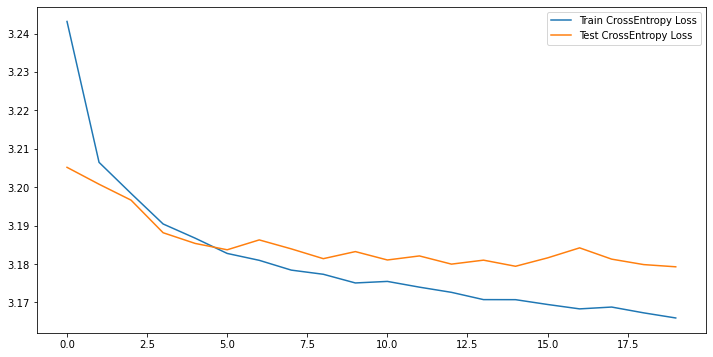

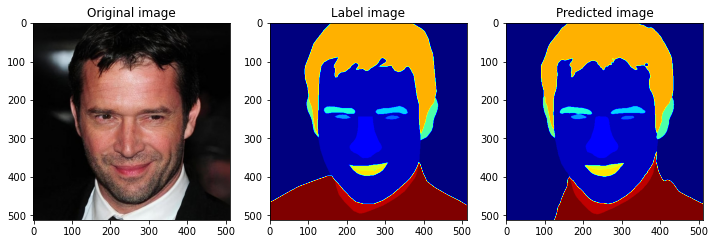

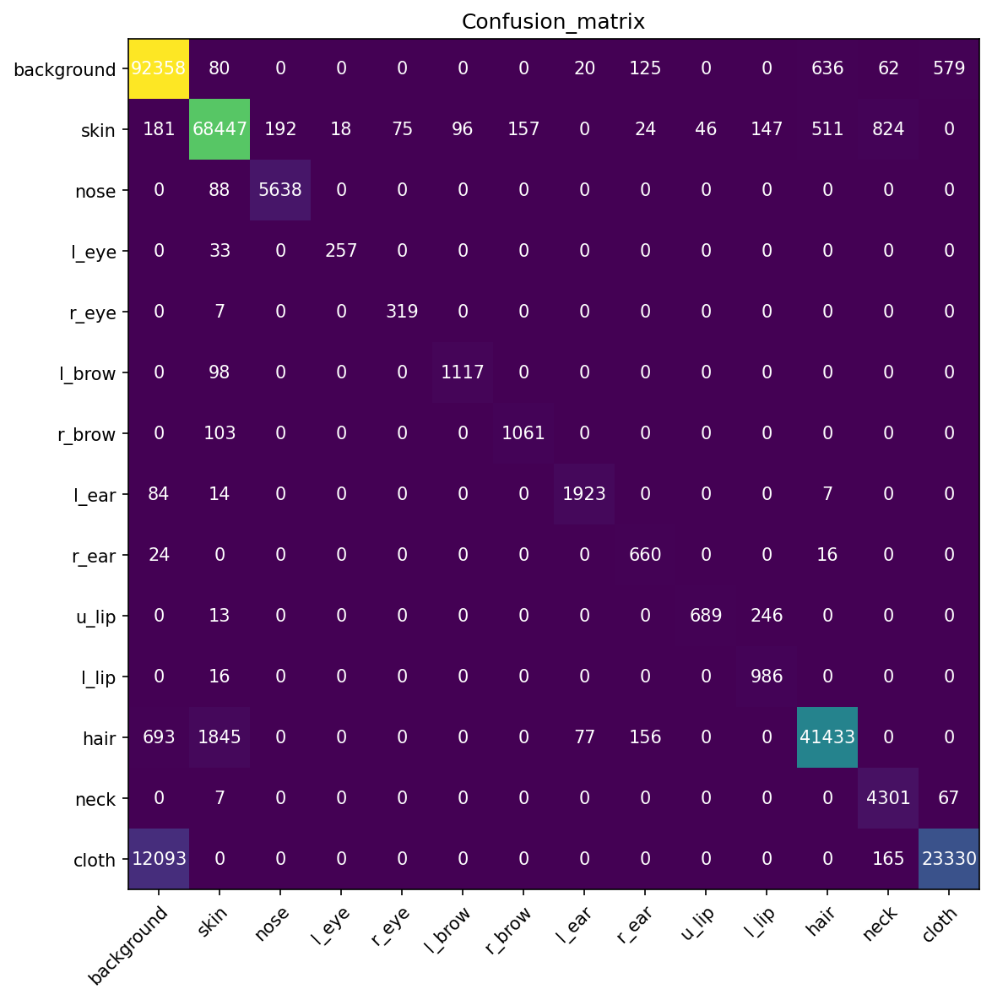

In [24]:
result_example('log_unet_v3_FL.npy')

### (5 pts) Report IoU and Dice-scores of each class on the test set.

In [12]:
def dice_coefficient(target, pred, num_classes=19):
    """
    Calculates the Dice coefficient for each class in a semantic segmentation problem.
    
    Parameters:
    target (np.ndarray): Target image of shape (height, width) with integer labels from 0 to num_classes-1.
    pred (np.ndarray): Predicted image of shape (height, width) with integer labels from 0 to num_classes-1.
    num_classes (int): Number of classes in the semantic segmentation problem (default: 19).
    
    Returns:
    np.ndarray: Array of shape (num_classes,) with the Dice coefficients for each class.
    """
    # Convert target and pred images to 1D arrays
    target_flat = target.reshape(-1)
    pred_flat = pred.reshape(-1)

    # Create empty array to store metrics
    metrics = np.zeros(num_classes)
    
    # Loop through each class label
    for label in range(num_classes):
        # Create binary masks for current class
        target_mask = np.where(target_flat == label, 1, 0)
        pred_mask = np.where(pred_flat == label, 1, 0)

        # Calculate TP, FP, and FN
        TP = np.sum(np.logical_and(target_mask, pred_mask))
        FP = np.sum(np.logical_and(1-target_mask, pred_mask))
        FN = np.sum(np.logical_and(target_mask, 1-pred_mask))

        # Calculate Dice coefficient
        denominator = 2 * TP + FP + FN
        if denominator == 0:
            epsilon = 1e-7
            dice = (2 * TP + epsilon) / (2 * TP + FP + FN + epsilon)
        else:
            dice = 2 * TP / (2 * TP + FP + FN)

        # Store metric for current class
        metrics[label] = dice
    
    return metrics


def iou_metric(target, pred, num_classes=19):
    """
    Calculates the Intersection over Union (IoU) metric for each class in a semantic segmentation problem.
    
    Parameters:
    target (np.ndarray): Target image of shape (height, width) with integer labels from 0 to num_classes-1.
    pred (np.ndarray): Predicted image of shape (height, width) with integer labels from 0 to num_classes-1.
    num_classes (int): Number of classes in the semantic segmentation problem (default: 19).
    
    Returns:
    np.ndarray: Array of shape (num_classes,) with the IoU metrics for each class.
    """
    # Convert target and pred images to 1D arrays
    target_flat = target.reshape(-1)
    pred_flat = pred.reshape(-1)

    # Create empty array to store metrics
    metrics = np.zeros(num_classes)
    
    # Loop through each class label
    for label in range(num_classes):
        # Create binary masks for current class
        target_mask = np.where(target_flat == label, 1, 0)
        pred_mask = np.where(pred_flat == label, 1, 0)

        # Calculate TP, FP, and FN
        TP = np.sum(np.logical_and(target_mask, pred_mask))
        FP = np.sum(np.logical_and(1-target_mask, pred_mask))
        FN = np.sum(np.logical_and(target_mask, 1-pred_mask))

        # Calculate IoU metric
        denominator = TP + FP + FN
        if denominator == 0:
            epsilon = 1e-7
            iou = (TP + epsilon) / (TP + FP + FN + epsilon)
        else:
            iou = TP / (TP + FP + FN)

        # Store metric for current class
        metrics[label] = iou
    
    return metrics

def dice_iou_metrics_report(model, test_loader):
    label_list = ['background','skin', 'nose', 'eye_g', 'l_eye', 'r_eye',
                      'l_brow', 'r_brow', 'l_ear', 'r_ear', 'mouth',
                      'u_lip', 'l_lip', 'hair', 'hat',
                      'ear_r', 'neck_l', 'neck', 'cloth']
    total_dice_scores, total_iou_scores = [], []
    for image,target in tqdm(test_loader):
        image = image.to(device)
        target = target.to(device)
        for i in range(len(target)):
            total_dice_scores.append(dice_coefficient(target[i].detach().cpu().numpy(), predict(image)[i]))
            total_iou_scores.append(iou_metric(target[i].detach().cpu().numpy(), predict(image)[i]))
    mean_ds_metric = np.mean(total_dice_scores, axis = 0)
    mean_iou_metric = np.mean(total_iou_scores, axis = 0)
    print(f'Mean dice coef in test set \n{mean_ds_metric}')
    plt.figure(figsize = (16,6))
    plt.bar(range(len(mean_ds_metric)), mean_ds_metric)
    plt.xticks(range(len(label_list)), label_list)
    for i in range(len(label_list)):
        plt.text(i, mean_ds_metric[i],round(mean_ds_metric[i],2), horizontalalignment='center',
                 verticalalignment='bottom', fontdict={'fontweight':500});
    plt.title('Mean Dice coefficient for each classes')
    plt.show()
    print(f'Mean IoU in test set \n{mean_iou_metric}')
    plt.figure(figsize = (16,6))
    plt.bar(range(len(mean_iou_metric)), mean_iou_metric)
    plt.xticks(range(len(label_list)), label_list)
    for i in range(len(label_list)):
        plt.text(i, mean_iou_metric[i],round(mean_iou_metric[i],2), horizontalalignment='center',
                 verticalalignment='bottom', fontdict={'fontweight':500});
    plt.title('Mean IOU metric for each classes')
    plt.show()
    return total_dice_scores, total_iou_scores

In [51]:
len(test_loader)

313

-------------------- THIS IS METRICS FOR MODEL TRAINED WITH FOCAL LOSS --------------------


100%|█████████████████████████████████████████| 313/313 [03:13<00:00,  1.61it/s]


Mean dice coef in test set 
[0.94431422 0.96198814 0.93828248 0.83555313 0.88003536 0.88163503
 0.82748283 0.82847643 0.79055706 0.79694137 0.83534711 0.87957487
 0.89431776 0.90939464 0.86598032 0.67186908 0.9584     0.85018019
 0.70413155]


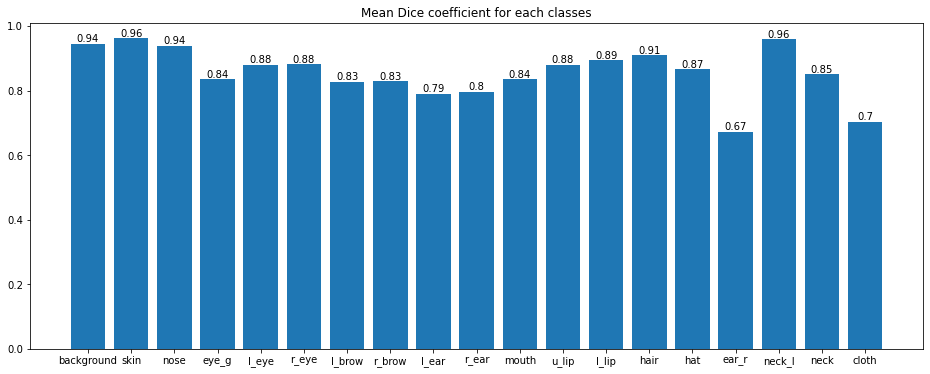

Mean IoU in test set 
[0.90272784 0.92752165 0.88477812 0.83134091 0.80215731 0.80442007
 0.73128712 0.73299639 0.74772146 0.75673942 0.79235828 0.79420508
 0.81897157 0.86152062 0.86330035 0.64138499 0.9584     0.78220604
 0.66584371]


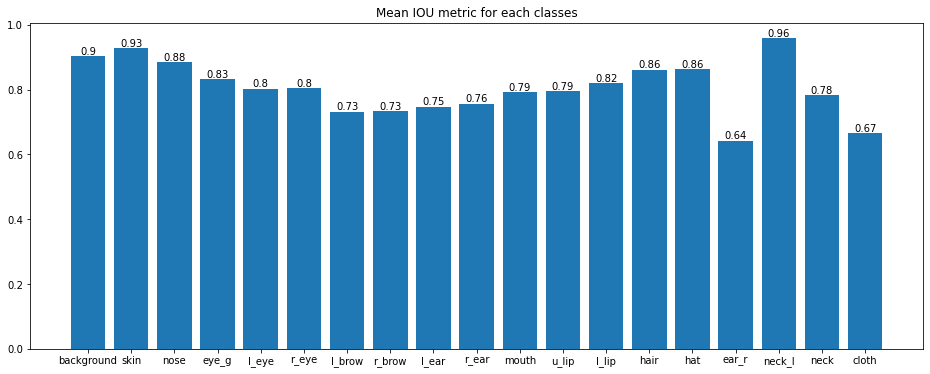

In [60]:
model = smp.Unet(
    encoder_name="resnet18",     # choose encoder, e.g. mobilenet_v2 or efficientnet-b7
    encoder_weights="imagenet",     # use `imagenet` pre-trained weights for encoder initialization
    in_channels=3,                  # model input channels (1 for gray-scale images, 3 for RGB, etc.)
    classes=19,                      # model output channels (number of classes in your dataset)
    activation = 'softmax2d'
).to(device)

model.load_state_dict(torch.load('models/unet_smp_v3_FL.pth', map_location=torch.device("cpu")))
test_data = CelebAMaskHQDataset(train=False)
test_loader = DataLoader(test_data, batch_size=batch_size, shuffle=False)

print(20*'-', 'THIS IS METRICS FOR MODEL TRAINED WITH FOCAL LOSS', 20*'-')

total_dice_scores, total_iou_scores = dice_iou_metrics_report(model, test_loader)

**Conclusions**

I don't now why, but metrics for model trained with CELoss and FocalLoss was the same (you can maske sure of this if you load state dict of ```unet_smp_v3.pth```)

### Bonus: my own model

In [4]:
import torch
import torch.nn as nn

class SimpleCNN(nn.Module):
    def __init__(self, num_classes=19):
        super(SimpleCNN, self).__init__()
        self.conv1 = nn.Conv2d(3, 64, kernel_size=3, padding=1)
        self.bn1 = nn.BatchNorm2d(64)
        self.relu1 = nn.ReLU(inplace=True)
        self.conv2 = nn.Conv2d(64, 128, kernel_size=3, padding=1)
        self.bn2 = nn.BatchNorm2d(128)
        self.relu2 = nn.ReLU(inplace=True)
        self.conv3 = nn.Conv2d(128, 256, kernel_size=3, padding=1)
        self.bn3 = nn.BatchNorm2d(256)
        self.relu3 = nn.ReLU(inplace=True)
        self.conv4 = nn.Conv2d(256, num_classes, kernel_size=1)

    def forward(self, x):
        x = self.conv1(x)
        x = self.bn1(x)
        x = self.relu1(x)
        x = self.conv2(x)
        x = self.bn2(x)
        x = self.relu2(x)
        x = self.conv3(x)
        x = self.bn3(x)
        x = self.relu3(x)
        x = self.conv4(x)
        x = nn.functional.softmax(x, dim=1)
        return x

In [6]:
n_epochs = 10
learning_rate = 0.0003

# model = smp.Unet(
#     encoder_name="resnet18",     # choose encoder, e.g. mobilenet_v2 or efficientnet-b7
#     encoder_weights="imagenet",     # use `imagenet` pre-trained weights for encoder initialization
#     in_channels=3,                  # model input channels (1 for gray-scale images, 3 for RGB, etc.)
#     classes=19,                      # model output channels (number of classes in your dataset)
#     activation = 'softmax2d'
# ).to(device)

model = SimpleCNN().to(device)

criterion = nn.CrossEntropyLoss()
# criterion = FocalLoss('multiclass')
# criterion = DiceLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)

train_data = CelebAMaskHQDataset(train=True)
test_data = CelebAMaskHQDataset(train=False)

batch_size = 2
train_loader = DataLoader(train_data, batch_size=batch_size, shuffle=True)
test_loader = DataLoader(test_data, batch_size=batch_size, shuffle=False)

logging = train(model, optimizer, criterion, n_epochs, model_name='models/simpe_cNN')
np.save('log_simple_cNN.npy', logging)

  0%|                                                    | 0/10 [00:00<?, ?it/s]

epoch [0/10], step [500/1875], train loss: 2.6010
epoch [0/10], step [1000/1875], train loss: 2.2202
epoch [0/10], step [1500/1875], train loss: 2.2190
epoch [0/10], step [250/625], val loss: 2.4280
epoch [0/10], step [500/625], val loss: 2.6664


 10%|████▎                                      | 1/10 [05:15<47:16, 315.19s/it]

epoch: 0, train loss for epoch 2.3907995202382404, val loss for epoch 2.4051197414398193
epoch [1/10], step [500/1875], train loss: 2.5818
epoch [1/10], step [1000/1875], train loss: 2.3469
epoch [1/10], step [1500/1875], train loss: 2.2757
epoch [1/10], step [250/625], val loss: 2.4267
epoch [1/10], step [500/625], val loss: 2.6691


 20%|████████▌                                  | 2/10 [10:29<41:58, 314.87s/it]

epoch: 1, train loss for epoch 2.353430223337809, val loss for epoch 2.3873773418426514
epoch [2/10], step [500/1875], train loss: 2.4745
epoch [2/10], step [1000/1875], train loss: 2.5337
epoch [2/10], step [1500/1875], train loss: 2.4149
epoch [2/10], step [250/625], val loss: 2.3621
epoch [2/10], step [500/625], val loss: 2.5772


 30%|████████████▉                              | 3/10 [15:44<36:44, 314.87s/it]

epoch: 2, train loss for epoch 2.342429772822062, val loss for epoch 2.345294641494751
epoch [3/10], step [500/1875], train loss: 2.2016
epoch [3/10], step [1000/1875], train loss: 2.4249
epoch [3/10], step [1500/1875], train loss: 2.2953
epoch [3/10], step [250/625], val loss: 2.3616
epoch [3/10], step [500/625], val loss: 2.5743


 40%|█████████████████▏                         | 4/10 [20:59<31:29, 314.99s/it]

epoch: 3, train loss for epoch 2.3357509745279947, val loss for epoch 2.33965040473938
epoch [4/10], step [500/1875], train loss: 2.4011
epoch [4/10], step [1000/1875], train loss: 2.3995
epoch [4/10], step [1500/1875], train loss: 2.3689
epoch [4/10], step [250/625], val loss: 2.4068
epoch [4/10], step [500/625], val loss: 2.6149


 50%|█████████████████████▌                     | 5/10 [26:14<26:14, 314.89s/it]

epoch: 4, train loss for epoch 2.330475218963623, val loss for epoch 2.359848099899292
epoch [5/10], step [500/1875], train loss: 2.2862
epoch [5/10], step [1000/1875], train loss: 2.4527
epoch [5/10], step [1500/1875], train loss: 2.2189
epoch [5/10], step [250/625], val loss: 2.2624
epoch [5/10], step [500/625], val loss: 2.3333


 60%|█████████████████████████▊                 | 6/10 [31:29<20:59, 314.83s/it]

epoch: 5, train loss for epoch 2.3282577971140546, val loss for epoch 2.3318165420532226
epoch [6/10], step [500/1875], train loss: 2.5568
epoch [6/10], step [1000/1875], train loss: 2.3732
epoch [6/10], step [1500/1875], train loss: 2.2476
epoch [6/10], step [250/625], val loss: 2.2597
epoch [6/10], step [500/625], val loss: 2.3940


 70%|██████████████████████████████             | 7/10 [36:44<15:44, 314.88s/it]

epoch: 6, train loss for epoch 2.3241966017405193, val loss for epoch 2.324255229949951
epoch [7/10], step [500/1875], train loss: 2.4258
epoch [7/10], step [1000/1875], train loss: 2.3019
epoch [7/10], step [1500/1875], train loss: 2.2995
epoch [7/10], step [250/625], val loss: 2.3530
epoch [7/10], step [500/625], val loss: 2.5531


 80%|██████████████████████████████████▍        | 8/10 [41:59<10:29, 314.93s/it]

epoch: 7, train loss for epoch 2.319725109608968, val loss for epoch 2.3392158740997315
epoch [8/10], step [500/1875], train loss: 2.3097
epoch [8/10], step [1000/1875], train loss: 2.2198
epoch [8/10], step [1500/1875], train loss: 2.2454
epoch [8/10], step [250/625], val loss: 2.2641
epoch [8/10], step [500/625], val loss: 2.4016


 90%|██████████████████████████████████████▋    | 9/10 [47:14<05:15, 315.03s/it]

epoch: 8, train loss for epoch 2.3191922852834064, val loss for epoch 2.3263016395568847
epoch [9/10], step [500/1875], train loss: 2.3551
epoch [9/10], step [1000/1875], train loss: 2.2938
epoch [9/10], step [1500/1875], train loss: 2.4060
epoch [9/10], step [250/625], val loss: 2.3015
epoch [9/10], step [500/625], val loss: 2.5577


100%|██████████████████████████████████████████| 10/10 [52:29<00:00, 314.94s/it]

epoch: 9, train loss for epoch 2.316202894337972, val loss for epoch 2.3356874774932863



/home/d_sherki/anaconda3/lib/python3.9/site-packages/numpy/lib/npyio.py:528: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.asanyarray(arr)


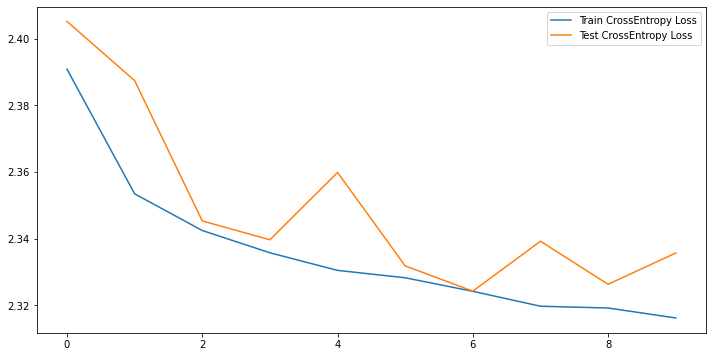

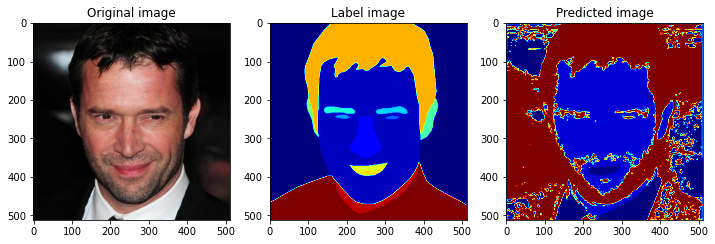

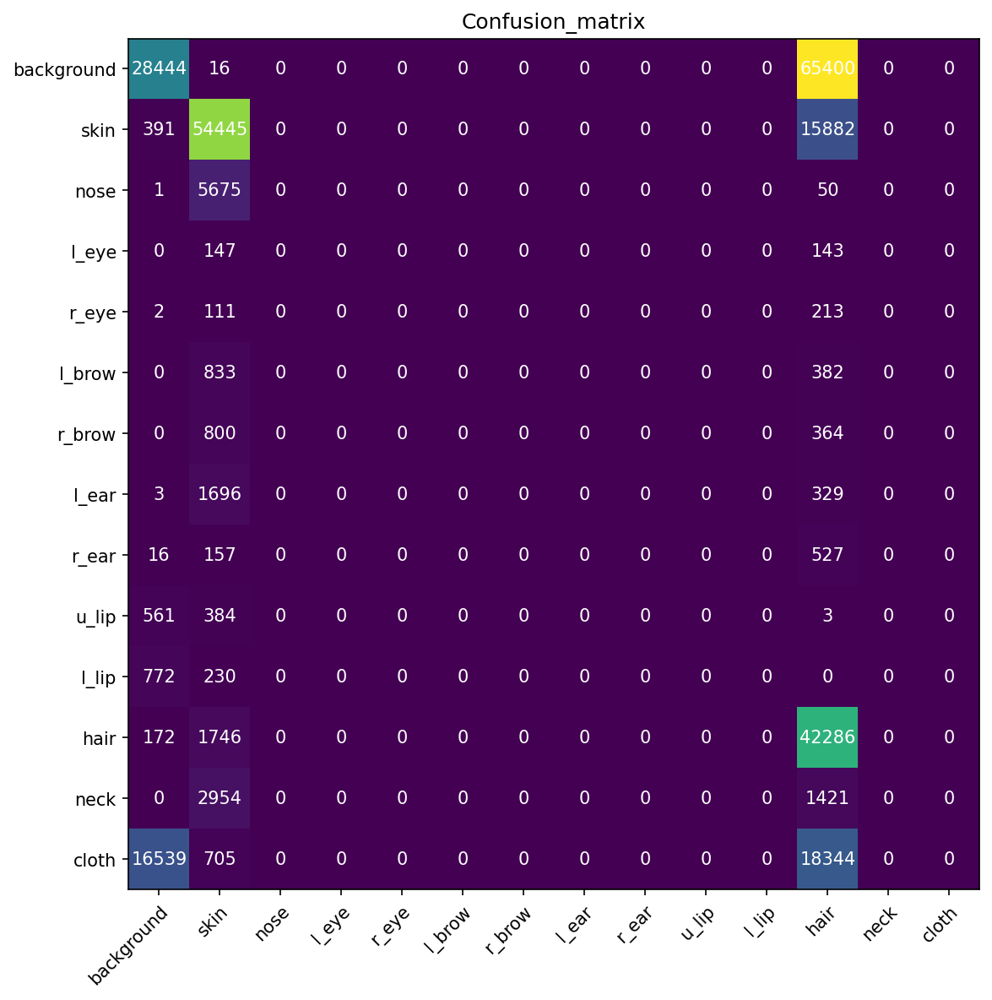

In [11]:
result_example('log_simple_cNN.npy')

100%|█████████████████████████████████████████| 625/625 [03:51<00:00,  2.69it/s]

Mean dice coef in test set 
[0.71331197 0.72884842 0.         0.9392     0.0216     0.0216
 0.028      0.0376     0.4696     0.52       0.4248     0.004
 0.004      0.6989443  0.9576     0.7464     0.9584     0.05224419
 0.4264    ]


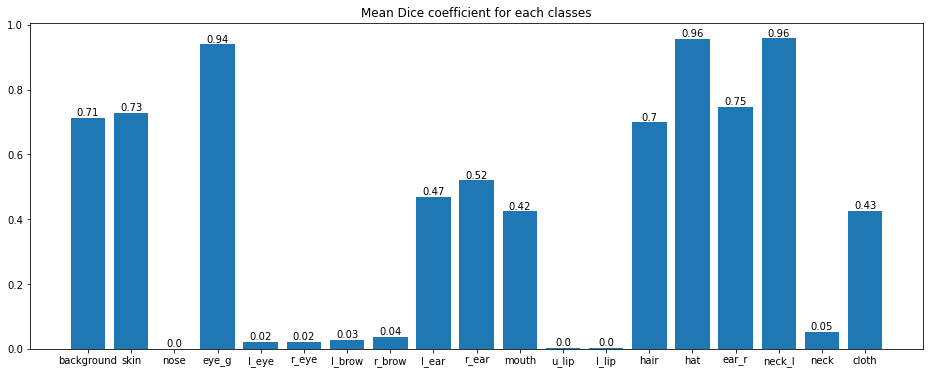

Mean IoU in test set 
[0.60535485 0.5882735  0.         0.9392     0.0216     0.0216
 0.028      0.0376     0.4696     0.52       0.4248     0.004
 0.004      0.57940037 0.9576     0.7464     0.9584     0.03081784
 0.4264    ]


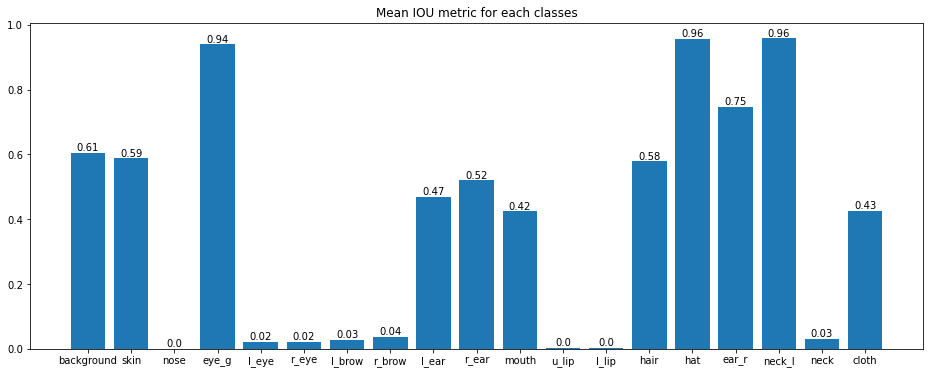

In [17]:
_ = dice_iou_metrics_report(model, test_loader)

### (5 pts) Try to add augmentations

Number batches in train set is 1875


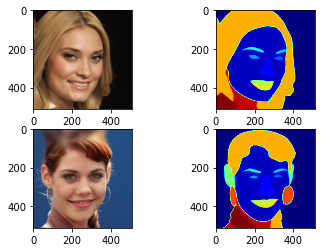

In [12]:
from torchvision.io import read_image
import concurrent.futures
import albumentations as A
from albumentations.pytorch import ToTensorV2
from PIL import Image

class CelebAMaskHQDatasetAug(Dataset):
    def __init__(self, train=True, transform=None, num_augmentations=1):
        self.transform = transform
        self.train = train
        self.num_augmentations = num_augmentations
        
        if self.train:
            self.img_dir = 'train_img'
            self.mask_dir = 'train_img_mask'
        else:
            self.img_dir = 'test_img'
            self.mask_dir = 'test_img_mask'
    
        self.img_paths = sorted([os.path.join(self.img_dir, f) for f in os.listdir(self.img_dir)])
        self.mask_paths = sorted([os.path.join(self.mask_dir, f.replace('.jpg', '.png')) for f in os.listdir(self.img_dir)])
        
        self.num_images = len(self.img_paths)
        self.total_images = self.num_images * self.num_augmentations

    def __len__(self):
        return self.total_images

    def __getitem__(self, idx):
        orig_idx = idx // self.num_augmentations
        img_path = self.img_paths[orig_idx]
        mask_path = self.mask_paths[orig_idx]

        with Image.open(img_path).convert('RGB') as img:
            with Image.open(mask_path).convert('L') as mask:
                img = np.array(img)
                mask = np.array(mask)

        if self.transform is not None:
            augmented = self.transform(image=img, mask=mask)
            img = augmented['image']
            mask = augmented['mask']

        img = img.float() / 255.
        mask = mask.long().squeeze()

        return img, mask

train_transform = A.Compose([
        A.RandomCrop(height=512, width=512),
        A.Rotate(limit=15, p=0.5),
        A.ShiftScaleRotate(shift_limit=0.0625, scale_limit=0.1, rotate_limit=45, p=0.5),
        ToTensorV2()
    ], additional_targets={'mask': 'image'})

test_transform = A.Compose([
        A.CenterCrop(height=512, width=512),
        ToTensorV2()
    ], additional_targets={'mask': 'image'})

num_augmentations = 2 # количество аугментаций на каждое изображение
train_data = CelebAMaskHQDatasetAug(train=True, transform=train_transform, num_augmentations=num_augmentations)
test_data = CelebAMaskHQDatasetAug(train=False, transform=test_transform)

batch_size = 4
train_loader = DataLoader(train_data, batch_size=batch_size, shuffle=True)
test_loader = DataLoader(test_data, batch_size=batch_size, shuffle=False)

print(f'Number batches in train set is {len(train_loader)}')
x,y = next(iter(train_loader))
plt.subplot(221)
plt.imshow(x[0].permute(1,2,0).detach().cpu().numpy())
plt.subplot(222)
plt.imshow(y[0].detach().cpu().numpy(), cmap='jet')
plt.subplot(223)
plt.imshow(x[1].permute(1,2,0).detach().cpu().numpy())
plt.subplot(224)
plt.imshow(y[1].detach().cpu().numpy(), cmap='jet')
plt.show()

In [ ]:
n_epochs = 60
learning_rate = 0.0003

model = smp.Unet(
    encoder_name="resnet18",     # choose encoder, e.g. mobilenet_v2 or efficientnet-b7
    encoder_weights="imagenet",     # use `imagenet` pre-trained weights for encoder initialization
    in_channels=3,                  # model input channels (1 for gray-scale images, 3 for RGB, etc.)
    classes=19,                      # model output channels (number of classes in your dataset)
    activation = 'softmax2d'
).to(device)

criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)

train_data = CelebAMaskHQDatasetAug(train=True, transform = train_transform, num_augmentations=3)
test_data = CelebAMaskHQDatasetAug(train=False, transform = test_transform)

batch_size = 4
train_loader = DataLoader(train_data, batch_size=batch_size, shuffle=True)
test_loader = DataLoader(test_data, batch_size=batch_size, shuffle=False)

logging = train(model, optimizer, criterion, n_epochs, model_name='models/unet_smp_aug_v3_40_epochs')
np.save('log_unet_aug_v3_40_epochs.npy', logging)

  0%|                                                    | 0/60 [00:00<?, ?it/s]

Epoch [0/60], Step [500/2813], Train CE-Loss: 2.2130
Epoch [0/60], Step [1000/2813], Train CE-Loss: 2.1776
Epoch [0/60], Step [1500/2813], Train CE-Loss: 2.1911
Epoch [0/60], Step [2000/2813], Train CE-Loss: 2.1892
Epoch [0/60], Step [2500/2813], Train CE-Loss: 2.1590
Epoch [0/60], Step [250/313], Val CE-Loss: 2.2156


  2%|▋                                        | 1/60 [06:17<6:11:38, 377.94s/it]

Epoch [1/60], Step [500/2813], Train CE-Loss: 2.1494
Epoch [1/60], Step [1000/2813], Train CE-Loss: 2.1434
Epoch [1/60], Step [1500/2813], Train CE-Loss: 2.1568
Epoch [1/60], Step [2000/2813], Train CE-Loss: 2.1742
Epoch [1/60], Step [2500/2813], Train CE-Loss: 2.1224
Epoch [1/60], Step [250/313], Val CE-Loss: 2.1926


  3%|█▎                                       | 2/60 [12:34<6:04:36, 377.17s/it]

In [42]:
model = smp.Unet(
    encoder_name="resnet18",     # choose encoder, e.g. mobilenet_v2 or efficientnet-b7
    encoder_weights="imagenet",     # use `imagenet` pre-trained weights for encoder initialization
    in_channels=3,                  # model input channels (1 for gray-scale images, 3 for RGB, etc.)
    classes=19,                      # model output channels (number of classes in your dataset)
    activation = 'softmax2d'
).to(device)

model.load_state_dict(torch.load('models/unet_smp_aug_v3.pth', map_location=torch.device("cpu")))

<All keys matched successfully>

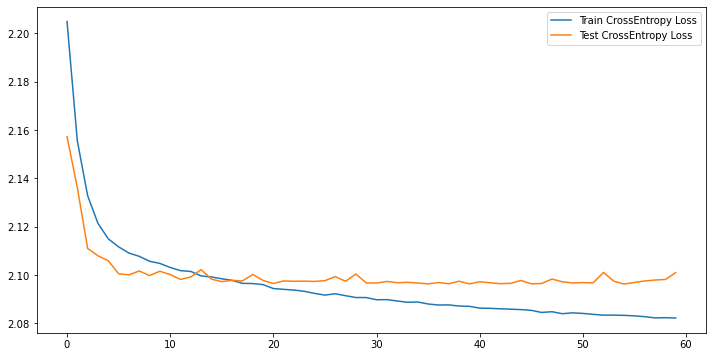

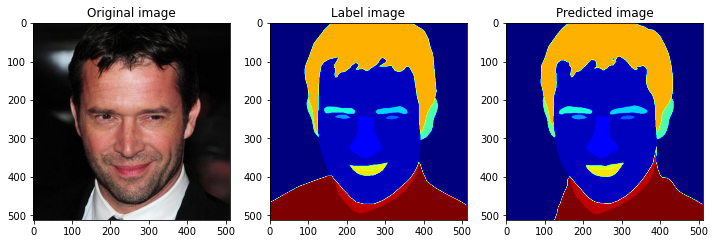

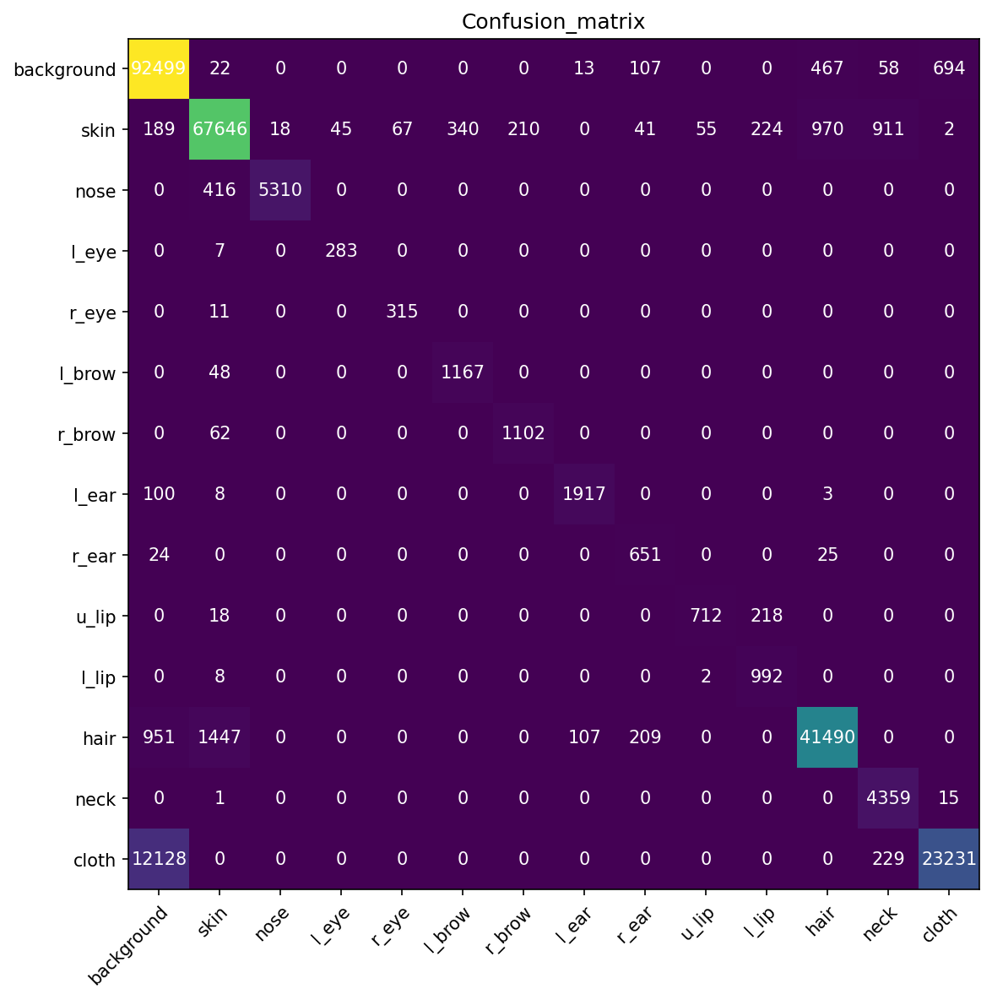

In [44]:
result_example('log_unet_aug_v3_40_epochs.npy')

100%|█████████████████████████████████████████| 313/313 [03:17<00:00,  1.58it/s]


Mean dice coef in test set 
[0.94110416 0.96014664 0.93370019 0.91605516 0.88518775 0.88207962
 0.82941506 0.8257108  0.80079143 0.78241784 0.86076318 0.87792346
 0.89589373 0.90347195 0.9576     0.7464     0.9584     0.85846202
 0.70192864]


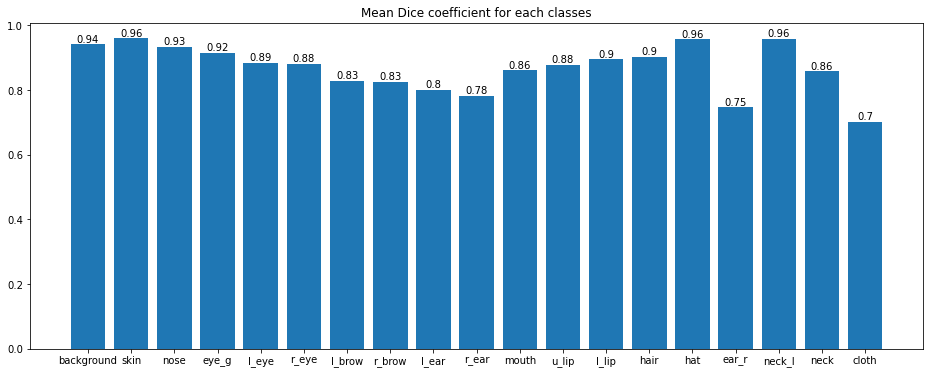

Mean IoU in test set 
[0.89779157 0.92432634 0.87705968 0.91213046 0.81017214 0.80622711
 0.7347904  0.7315154  0.75692079 0.74261224 0.81916107 0.79377687
 0.82293759 0.85454855 0.9576     0.7464     0.9584     0.79059139
 0.66193573]


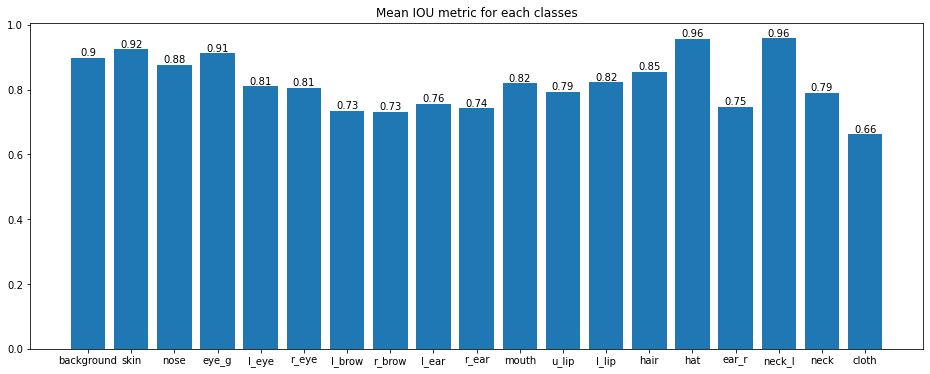

In [45]:
total_dice_scores, total_iou_scores = dice_iou_metrics_report(model, test_loader)

### (2 pts) Plot 4-6 examples of obtained results on the test set (show the best and the worst according to the loss/metrics).

In [46]:
# Now I have the idea: I want to transform all total dice and iou scores for each sample in test loader
# to vector norm for finding the best and the worst scores

dice_norm = [np.linalg.norm(dice) for dice in total_dice_scores]
iou_norm = [np.linalg.norm(iou) for iou in total_iou_scores]

In [47]:
best_dice_idx = np.argmax(dice_norm)
best_iou_idx = np.argmax(iou_norm)
worst_dice_idx = np.argmin(dice_norm)
worst_iou_idx = np.argmin(iou_norm)

In [48]:
best_dice_idx, best_iou_idx, worst_dice_idx,worst_iou_idx

(532, 532, 5, 5)

In [27]:
test_loader = DataLoader(test_data, batch_size=1, shuffle=False)

------------------------------ THE WORST METRIC SAMPLE ------------------------------


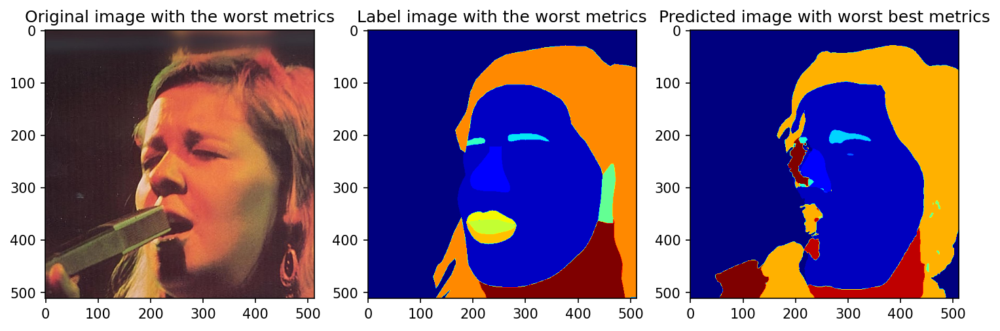

Dice score equals 
[0.92188555 0.88952479 0.77047322 0.         0.         0.
 0.8066633  0.39669421 0.02499081 0.         0.01404646 0.
 0.01427644 0.83505225 1.         0.         1.         0.65999149
 0.        ]
IoU score equals 
[0.85509062 0.80103076 0.62664208 0.         0.         0.
 0.67597293 0.24742268 0.01265352 0.         0.00707291 0.
 0.00718954 0.7168152  1.         0.         1.         0.49252784
 0.        ]
------------------------------ RANDOM SAMPLE ------------------------------


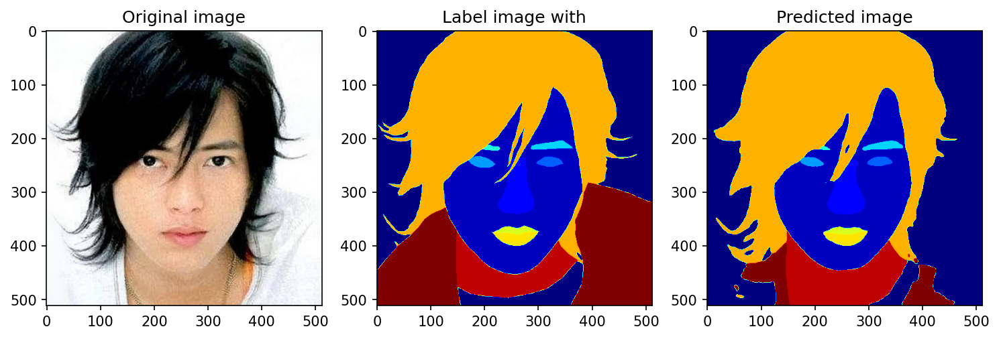

Dice score equals 
[0.73503748 0.95650265 0.91724826 1.         0.94240838 0.87765568
 0.90257559 0.56395349 1.         1.         0.         0.91289669
 0.96391568 0.93475195 1.         1.         1.         0.82601089
 0.29367141]
IoU score equals 
[0.58107451 0.91663161 0.84714549 1.         0.89108911 0.78198433
 0.82244898 0.39271255 1.         1.         0.         0.83975155
 0.93034483 0.87749698 1.         1.         1.         0.70359332
 0.17210719]
------------------------------ THE BEST METRIC SAMPLE ------------------------------


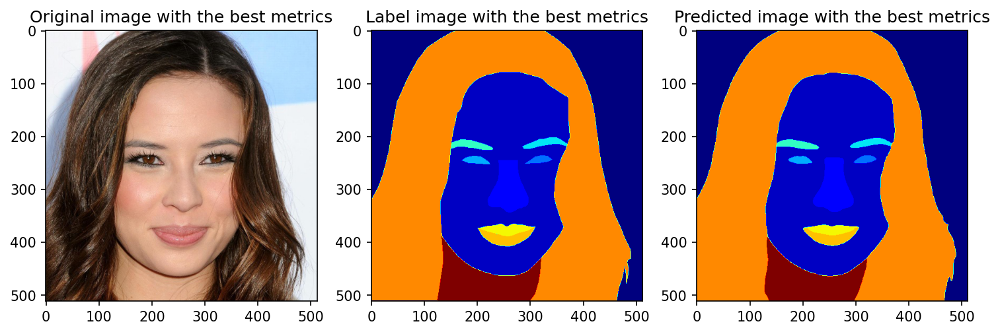

Dice score equals 
[0.9881908  0.98391813 0.96036922 1.         0.94426919 0.91674462
 0.92417582 0.92630502 1.         1.         1.         0.92387672
 0.91502499 0.98937597 1.         1.         1.         0.97507134
 1.        ]
IoU score equals 
[0.97665726 0.96834532 0.92375989 1.         0.89442231 0.8462867
 0.85903984 0.86272641 1.         1.         1.         0.85852312
 0.84336043 0.97897532 1.         1.         1.         0.95135534
 1.        ]
------------------------------ RANDOM SAMPLE ------------------------------


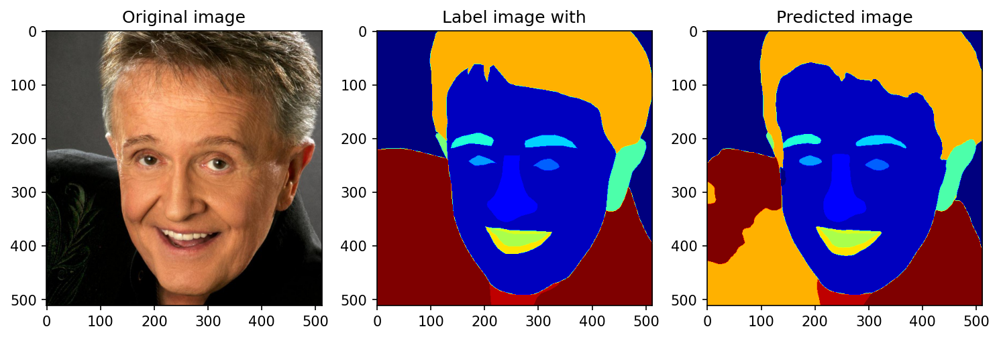

Dice score equals 
[0.96113051 0.95940976 0.93784666 1.         0.95888399 0.93251534
 0.87977567 0.8869849  0.93085219 0.64325843 0.93704795 0.8606921
 0.88153749 0.75747642 1.         1.         1.         0.89591793
 0.76942819]
IoU score equals 
[0.92516964 0.92198613 0.88296729 1.         0.92101551 0.87356322
 0.7853567  0.79692082 0.87064873 0.47412008 0.88155242 0.75545171
 0.78816901 0.6096274  1.         1.         1.         0.81145954
 0.6252607 ]


In [50]:
i = 0
random_samples_number = np.random.randint(len(test_loader), size = 2)
for x,y in test_loader:
    if i in [best_dice_idx, best_iou_idx]:
        print(30*'-','THE BEST METRIC SAMPLE',30*'-')
        plt.figure(figsize=(12,6), dpi = 150)
        plt.subplot(131)
        plt.imshow(x.squeeze().permute(1,2,0))
        plt.title('Original image with the best metrics')
        plt.subplot(132)
        plt.imshow(y.squeeze().detach().numpy(), cmap='jet')
        plt.title('Label image with the best metrics')
        plt.subplot(133)
        plt.title('Predicted image with the best metrics')
        plt.imshow(predict(x), cmap='jet')
        plt.show()
        print(f'Dice score equals \n{total_dice_scores[i]}')
        print(f'IoU score equals \n{total_iou_scores[i]}')

    elif i in [worst_dice_idx,worst_iou_idx]:
        print(30*'-','THE WORST METRIC SAMPLE',30*'-')
        plt.figure(figsize=(12,6), dpi = 150)
        plt.subplot(131)
        plt.imshow(x.squeeze().permute(1,2,0))
        plt.title('Original image with the worst metrics')
        plt.subplot(132)
        plt.imshow(y.squeeze().detach().numpy(), cmap='jet')
        plt.title('Label image with the worst metrics')
        plt.subplot(133)
        plt.title('Predicted image with worst best metrics')
        plt.imshow(predict(x), cmap='jet')
        plt.show()
        print(f'Dice score equals \n{total_dice_scores[i]}')
        print(f'IoU score equals \n{total_iou_scores[i]}')
    elif i in list(random_samples_number):
        print(30*'-','RANDOM SAMPLE',30*'-')
        plt.figure(figsize=(12,6), dpi = 150)
        plt.subplot(131)
        plt.imshow(x.squeeze().permute(1,2,0))
        plt.title('Original image')
        plt.subplot(132)
        plt.imshow(y.squeeze().detach().numpy(), cmap='jet')
        plt.title('Label image with')
        plt.subplot(133)
        plt.title('Predicted image')
        plt.imshow(predict(x), cmap='jet')
        plt.show()
        print(f'Dice score equals \n{total_dice_scores[i]}')
        print(f'IoU score equals \n{total_iou_scores[i]}')
    else:
        pass
    i += 1

### (3 pts) Explain why you solved the problem this way and not otherwise, provide description of experiments and their results. Analyze your metrics, are they suitable?

Hello, dear TAs!

I am not have so many experiments, but what I am do

1. I tried to use two different losses: convential CE loss and Focal loss (I assumed that FocalLoss will be better with classes imbalance, but I was surprised when CE loss and Focal loss give the same perfomance and metrics! (You can see convergence and metrics above).

2. I try to use different epoch options and my measure accuracy (I know, it's not good to imbalanced task ((( ) and Unet give **92.3%** accuracy on **6** epoch and **93.4%** on **40** epoch (with best model saving, when loss is minimal).

3. I try to use augmented and not augmented dataset: and my observation is the augmented model has little bit smaller Dice coefficient and IoU metric (but much smaller on 3 classes: ```eye_g, hat, ear_r``` ) - you can see the metrics report above.

4. I try to do different learning rate for Adam optimizer and ```3e-4``` is the best choice.

5. I implement my own cNN model, but it much worse works than black-box Unet. I try to implement DeepLab by myself, but I don't have enough computational resources.

Thank you for your hard job!

### (5 pts) Make additional function for inference that receives path to the image. Test your model on several photos not from the dataset (pick your own photo or any other from internet). Does your model work well on the new data?

Yes, my augmented model work well enough, and not augmented much more better.

Hard to predict - Kanye West (probably) according two previous point. I have only simple pictures. And the better performance on Elon Musk picture.

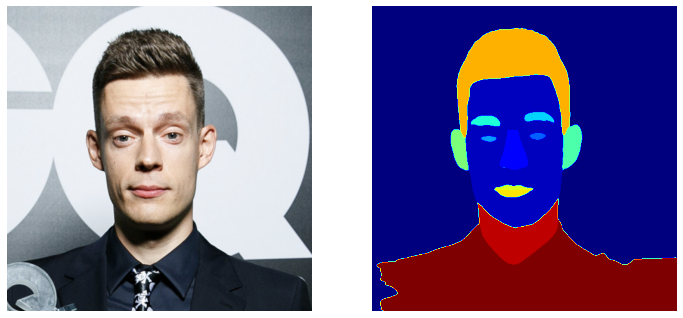

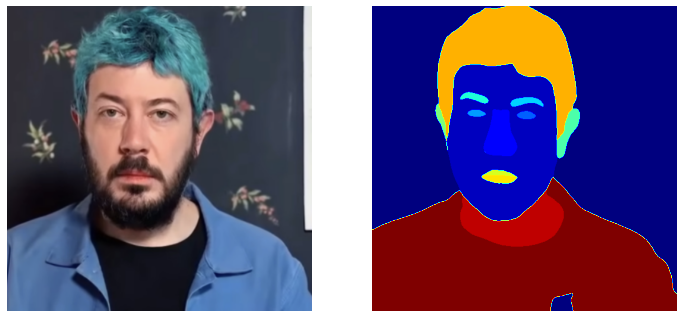

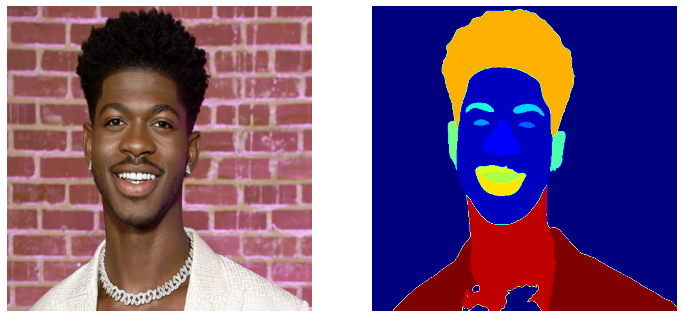

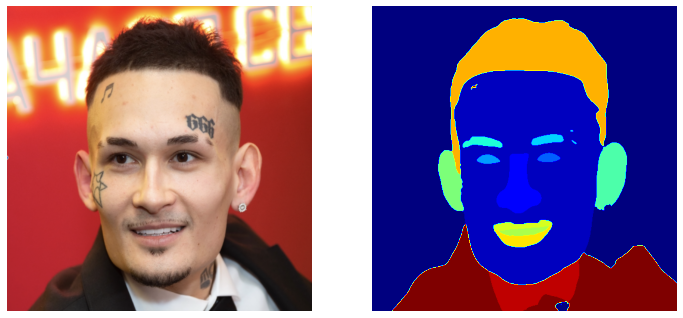

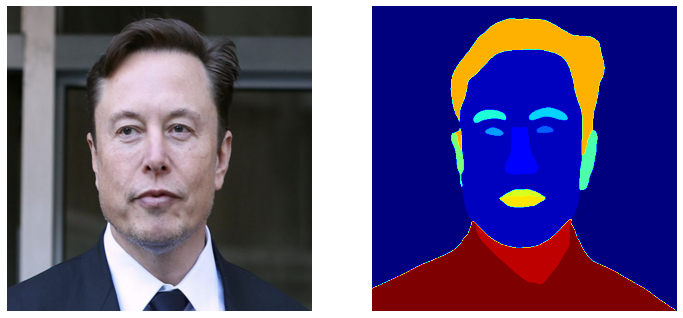

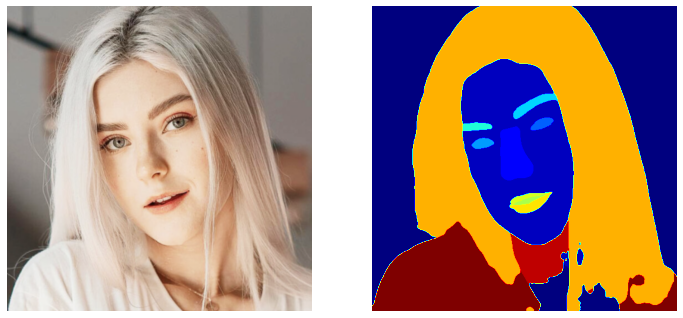

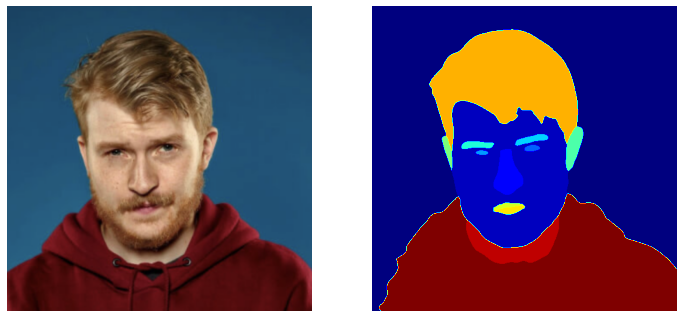

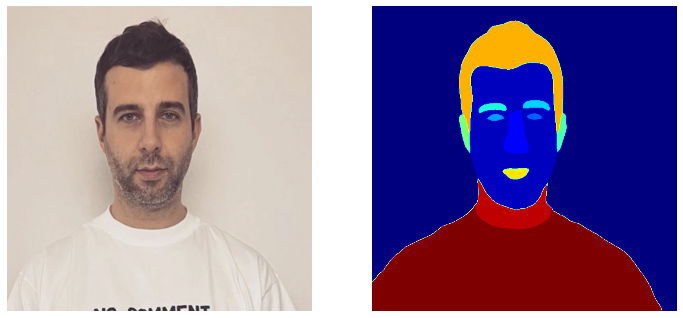

In [51]:
def image_predict(img_dir):
    img_paths = sorted([os.path.join(img_dir, f) for f in os.listdir(img_dir) if '.png' in f])
    resize_transform = transforms.Resize((512, 512))
    for img_path in img_paths:
        with Image.open(img_path).convert('RGB') as img:
            img = resize_transform(img)
            img_tensor = transforms.ToTensor()(img).unsqueeze(0)
            pred = predict(img_tensor.float())
            plt.figure(figsize=(12,6))
            plt.subplot(121)
            plt.imshow(np.array(img_tensor.squeeze(0).permute(1,2,0)))
            plt.axis('off')
            plt.subplot(122)
            plt.imshow(np.array(pred.squeeze()), cmap='jet')
            plt.axis('off')
            plt.show()

image_predict('famous_guys')

## Problem 2. Deep image prior (36 pts)

In the deep prior framework, we aim to learn a prior distribution over the parameters $\theta$ of a generative model such that, given some observation $\hat{y}$, we can sample a plausible output $y$ from the learned prior distribution. The goal is to learn a posterior distribution $p(z,\theta|\hat{y})$ over the latent variable $z$ and the parameters $\theta$ such that, given some observation $\hat{y}$ (e.g., an image of a face), we can sample a plausible latent variable $z$ and generate a corresponding output image $y= f_\theta(z)$ that is similar to the observation. The conditional distribution of $y$ given $\hat{y}$ can be written as an integral over $z$ and $\theta$:

$$p(y|\hat{y}) = \int p(y|z,\theta,\hat{y})p(z,\theta|\hat{y})dzd\theta$$

Unfortunately, in practice, it is difficult to compute this integral exactly, since we don't know the conditional distribution $p(y|z,\theta,\hat{y})$ and the posterior distribution $p(z,\theta|\hat{y})$. Instead, we can use an optimization approach to learn the prior distribution $p(z,\theta)$ and the network $f_\theta(z)$ that best approximate the true conditional distribution.

Specifically, we first assume that the latent variable $z$ is independent of the observation $\hat{y}$, i.e., $p(z,\theta|\hat{y}) = p(\theta|\hat{y})p(z)$. This allows us to rewrite the conditional distribution of $y$ as:

$$p(y|\hat{y}) = \int p(y|z,\theta,\hat{y})p(\theta|\hat{y})p(z)dzd\theta$$

Next, we use an optimization approach to learn the parameters $\theta$ of the network to minimize the expected distance between the generated output $y=f_\theta(z)$ and the observation $\hat{y}$:

$$\min_\theta E(f_\theta(z),\hat{y})$$

To perform this optimization, we can apply a stochastic gradient descent approach where we sample random values of $z$ from the prior distribution $p(z)$ and compute the gradients of the loss function with respect to $\theta$ using backpropagation. This way, we can iteratively update the parameters of the network to improve its ability to generate realistic outputs given the observed data.

This approach is used to perform denoising, inpainting and super resolution. The basic architecture for the task is UNet, which we will use in our experiments.

## Implementation

In [1]:
import torch
import os
os.environ["KMP_DUPLICATE_LIB_OK"]="TRUE"
import torchvision
from torchvision import transforms
import gdown
from tqdm import tqdm
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
from torchmetrics import TotalVariation as TV

In [2]:
class Encoder_Block(torch.nn.Module):
    def __init__(self,inp_channels,out_channels):
        super().__init__()
        self.model = torch.nn.Sequential(
            torch.nn.Conv2d(inp_channels,out_channels,kernel_size=3,padding=1),
            torch.nn.BatchNorm2d(out_channels),
            torch.nn.ReLU(),
            torch.nn.Conv2d(out_channels,out_channels,kernel_size=3,padding=1),
            torch.nn.BatchNorm2d(out_channels),
            torch.nn.ReLU(),
        )
        self.downsample = torch.nn.MaxPool2d(2)
    def forward(self,x):
        int_out = self.model(x)
        return self.downsample(int_out), int_out

class Decoder_Block(torch.nn.Module):
    def __init__(self,inp_channels,out_channels):
        super().__init__()
        self.upsample = torch.nn.ConvTranspose2d(inp_channels,out_channels,kernel_size=2,stride=2)
        self.model = torch.nn.Sequential(
            torch.nn.Conv2d(inp_channels,out_channels,kernel_size=3,padding=1),
            torch.nn.BatchNorm2d(out_channels),
            torch.nn.ReLU(),
            torch.nn.Conv2d(out_channels,out_channels,kernel_size=3,padding=1),
            torch.nn.BatchNorm2d(out_channels),
            torch.nn.ReLU(),
        )
    def forward(self,x,enc):
        x = self.upsample(x)
        x = torch.cat([x,enc],dim=1)
        return self.model(x)

In [3]:
class Unet(torch.nn.Module):
    def __init__(self,inc,outc,hidden_size=16):
        super().__init__()
        self.Encoder = torch.nn.ModuleList([
            Encoder_Block(inc,hidden_size),
            Encoder_Block(hidden_size,hidden_size*2),
            Encoder_Block(hidden_size*2,hidden_size*4),
            Encoder_Block(hidden_size*4,hidden_size*8),
        ])
        self.bottleneck = torch.nn.Sequential(
            torch.nn.Conv2d(hidden_size*8,hidden_size*16,kernel_size=1),
            torch.nn.BatchNorm2d(hidden_size*16),
            torch.nn.ReLU(),
            torch.nn.Conv2d(hidden_size*16,hidden_size*16,kernel_size=1),
            torch.nn.BatchNorm2d(hidden_size*16),
            torch.nn.ReLU()
        )
        self.Decoder = torch.nn.ModuleList([
            Decoder_Block(hidden_size*16,hidden_size*8),
            Decoder_Block(hidden_size*8,hidden_size*4),
            Decoder_Block(hidden_size*4,hidden_size*2),
            Decoder_Block(hidden_size*2,hidden_size*1),
        ])
        self.last_layer = torch.nn.Sequential(
            torch.nn.Conv2d(hidden_size,outc,kernel_size=3,padding="same"),
            torch.nn.Sigmoid()
        )
    def forward(self,x):
        encs = []
        for module in self.Encoder:
            x, enc = module(x)
            encs.append(enc)

        encs = encs[::-1]
        x = self.bottleneck(x)

        for i,module in enumerate(self.Decoder):
            x = module(x,encs[i])
        return self.last_layer(x)

In [4]:
device = torch.device("cuda:3" if torch.cuda.is_available() else "cpu")

In [88]:
sharing_link = "https://drive.google.com/file/d/1QMZ9_XdFRfj-arUvW_hlG5Mw8vjzTLsU/view?usp=share_link"
gdown.download(url=sharing_link, output="./data.zip", quiet=False, fuzzy=True)
!unzip ./data.zip

Downloading...
From: https://drive.google.com/uc?id=1QMZ9_XdFRfj-arUvW_hlG5Mw8vjzTLsU
To: /home/d_sherki/DL/hw2/data.zip
100%|██████████████████████████████████████| 1.60M/1.60M [00:00<00:00, 14.2MB/s]


'./data.zip'

In [5]:
transform = transforms.Compose([
    transforms.ToTensor(),
])

In [6]:
img = transform(Image.open("./data/denoising/F16_GT.png"))[None].to(device)

## Your work starts here

In [7]:
noise_strength = 0.1
corrupted_img = (img + torch.randn_like(img)*noise_strength).clamp(0,1)

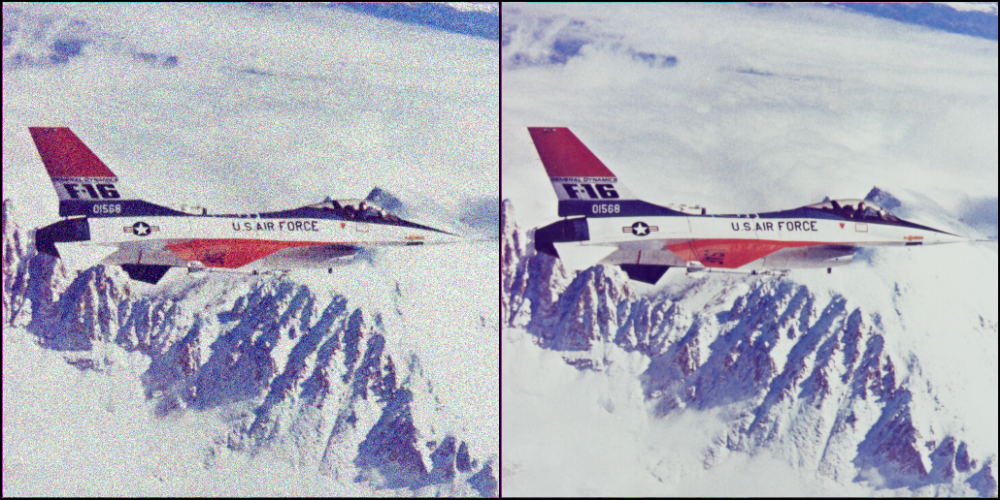

In [8]:
transforms.ToPILImage()(torchvision.utils.make_grid(torch.cat([corrupted_img,img],dim=0),nrow=2,normalize=True))

## Optimization (6 pts)

Task: Implement an optimization function that takes a model, input image, corrupted image, original image, and the number of iterations as arguments.

Steps:

1. Initialize an optimizer (Adam optimizer with learning rate $10^{-4}$).
2. Write a cycle for optimization using the specified loss function (criterion).
3. In each step of the cycle, add a certain amount of noise (reg_noise=0.01) to the input $z$ to ensure computational stability.

**We have provided baseline values for hyperparameters in this and future tasks, but feel free to make adjustments if needed.**

In [96]:
def optimization(model,z,corrupted_img,orig_img,iters,criterion=torch.nn.MSELoss(),reg_noise=0.01):
    # your code is here
    model = model.to(device)
    z = z.to(device)
    corrupted_img = corrupted_img.to(device)
    orig_img = orig_img.to(device)
    optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)
    
    corr_loss, orig_loss = [], []
    for i in tqdm(range(iters)):
        optimizer.zero_grad()
        noise_z = z + reg_noise * torch.randn(z.shape).to(z.device)
        output = model(noise_z)
        loss_corr = criterion(output, corrupted_img)
        corr_loss.append(loss_corr.item())
        loss_orig = criterion(output, orig_img)
        orig_loss.append(loss_orig.item())
        loss = loss_corr
        loss.backward()
        optimizer.step()
    return model, output, corr_loss, orig_loss

### Run the optimization (6 pts):

1. Start by initializing the UNet model with 32 input channels, 3 output channels, and a hidden size of 16.
2. Create a model input of size (1, 32, img.size(2), img.size(3)) by sampling from a normal distribution with a mean of 0 and standard deviation of 0.1.
3. Train the model for 3000 iterations.
4. Plot the training convergence with the loss computed for both generated and corrupted images.
5. Plot the training convergence with the loss computed for both generated and original images.
6. Visualize the results, including the original image, the corrupted image, and the restored image.
7. Explain obtained results (**Hint: look closely at the plot from step 5**)

In [97]:
# your code is here
## 1. Initializing UNet
model = Unet(inc=32, outc=3, hidden_size=16)
## 2. Model input
z = torch.randn(1, 32, img.size(2), img.size(3)) * 0.1
## 3. Train the model for 3000 iterations
model, restored_img, corr_loss, orig_loss = optimization(model, z, corrupted_img, img, 3000)

100%|███████████████████████████████████████| 3000/3000 [06:19<00:00,  7.90it/s]


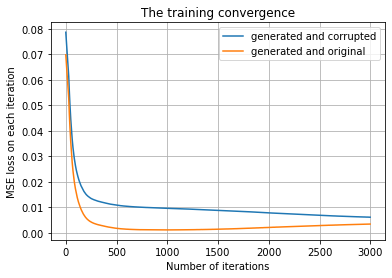

In [149]:
## 4. Plot the training convergence with the loss computed for both generated and corrupted images.
## 5. Plot the training convergence with the loss computed for both generated and original images.
def convergence_plot(convergences, labels, loss_name = 'MSE', title = 'The training convergence'):
    for convergence, label in zip(convergences, labels):
        plt.plot(convergence, label = label)
    plt.xlabel('Number of iterations')
    plt.ylabel(f'{loss_name} loss on each iteration')
    plt.title(title)
    plt.grid(True)
    plt.legend()
    plt.show()

convergence_plot([corr_loss, orig_loss], ['generated and corrupted','generated and original'])

The original image/The corrupted image/The restored image


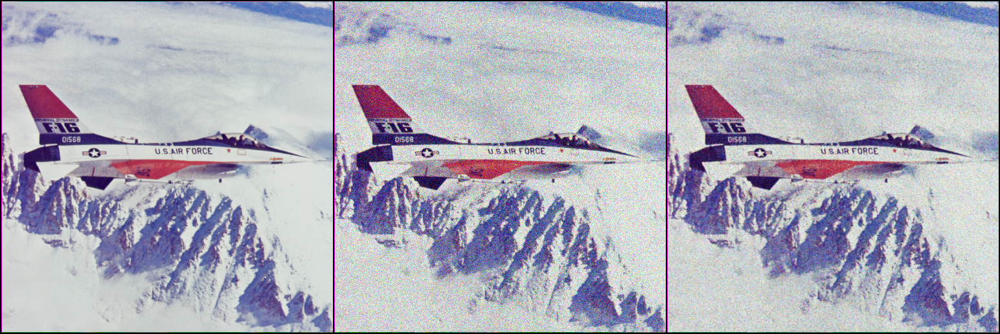

In [119]:
# 6. Visualize the results, including the original image, the corrupted image, and the restored image.

print('The original image/The corrupted image/The restored image')
transforms.ToPILImage()(torchvision.utils.make_grid(torch.cat([img, corrupted_img, restored_img],
                                                              dim=0),ncol=1, normalize=True))

### Explain obtained results (Hint: look closely at the plot from step 5)

---

## Early stopping (3 pts)

One solution to prevent the recurrence of past issues is by terminating the training process at an optimal point. However, determining the ideal number of iterations can be a challenging task. Therefore, your objective is to:

1. Find out appropriate number of iterations (the best reconstruction of original image)
2. Suggest stopping criteria for the denoising task in real case (when you do not know ground truth) (**Hint: use Total Variation metric to measure the amount of noise in the image**)
3. Compare the result of your strategy with found number of iterations in the first step

### 1. Find out appropriate number of iterations (the best reconstruction of original image)

In [157]:
# your code is here, find out appropriate number of iterations
optimal_iteration = orig_loss.index(min(orig_loss))
print(f'Optimal iteration number is {optimal_iteration}')

model = Unet(inc=32, outc=3, hidden_size=16)
z = torch.randn(1, 32, img.size(2), img.size(3)) * 0.1
model, restored_img, corr_loss, orig_loss = optimization(model, z, corrupted_img, img, optimal_iteration)

Optimal iteration number is 932


100%|█████████████████████████████████████████| 932/932 [02:56<00:00,  5.27it/s]


### 2. Suggest stopping criteria for the denoising task in real case (when you do not know ground truth) 

In [16]:
def optimization_modified(model,z,noised_img,orig_img,iters,criterion=torch.nn.MSELoss()):
    #!g2.mig
    """
    The `tv_threshold` (0.1) parameter controls the weighting of the TV loss in the overall loss function. 
    The stopping criterion is based on the change in TV loss after `tv_change_stop_iters` iterations falls 
    below `tv_change_threshold` (0.01). Note that we need to keep track of the previous TV loss value (`prev_tv`) 
    to compute the change in TV loss. 
    """
    reg_noise=0.01
    tv_threshold=1e-7
    tv_change_threshold=0.1
    tv_change_stop_iters=20
    loss_variant = 0
    
    model = model.to(device)
    z = z.to(device)
    noised_img = noised_img.to(device)
    orig_img = orig_img.to(device)
    optimizer = torch.optim.Adam(model.parameters(), lr=0.0001)
    get_tv = TV().to(device)

    corr_loss = []
    orig_loss = []
    tv_loss = []
    tv_relative_loss = []
    prev_tv = 0
    rel_tv = 0
    tv_change_counter = 0
    M = 20

    for i in tqdm(range(iters)):
        optimizer.zero_grad()

        # adding noise to the input
        noise_z = z + reg_noise * torch.randn(z.shape).to(z.device)

        # getting the output of the model
        output = model(noise_z)

        # calculating the loss for corrupted image (generated + corrupted)
        loss_corr = criterion(output, noised_img)
        corr_loss.append(loss_corr.item())

        # calculating the loss for original image (generated + original)
        loss_orig = criterion(output, orig_img)
        orig_loss.append(loss_orig.item())

        # calculating the total variation loss
        torch_tv = get_tv(output)
        tv_loss.append(torch_tv.item())
        rel_tv = (100*(torch_tv - prev_tv) / torch_tv)
        if 1 <= i <= M:
            tv_relative_loss.append(rel_tv.item())
        else:
            MovAvg = (rel_tv.item() + np.sum(tv_relative_loss[-M:-1])) / M
            tv_relative_loss.append(MovAvg)
            

        #tqdm.write(f"rel_tv: {(tv_relative_loss[-1]):.3f} \t tv: {tv_threshold*torch_tv.item():.3f}\t cl: {loss_corr.item():.3f}")
        
        if prev_tv != 0:
            tv_change = np.abs(tv_relative_loss[-1])#torch.abs(rel_tv).item()
            if tv_change < tv_change_threshold:
                tv_change_counter += 1
            else:
                tv_change_counter = 0
            if tv_change_counter >= tv_change_stop_iters:
                print(f'Early stop in {i} iteration')
                print(f'Total Variance:{torch_tv.item() :.2f}')
                break
        prev_tv = torch_tv

        if loss_variant == 1:
            loss = loss_corr + tv_threshold * torch_tv
        else:
            loss = loss_corr

        loss.backward()
        optimizer.step()      

    return model, output, corr_loss, orig_loss, tv_loss

In [17]:
model = Unet(inc=32, outc=3, hidden_size=16)
model, restored_img_es, corr_loss_es, orig_loss_es, tv_loss_es = optimization_modified(model,z, corrupted_img,
                                                                                       img, iters=3000)

 22%|████████▋                               | 647/3000 [01:09<04:12,  9.32it/s]

Early stop in 647 iteration
Total Variance:37159.00


### 3. Compare the result of your strategy with found number of iterations in the first step

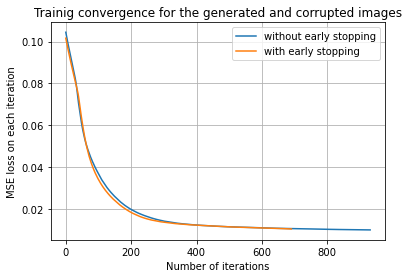

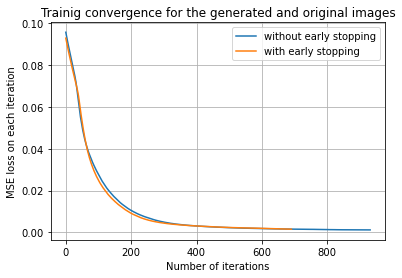

In [166]:
convergence_plot([corr_loss, corr_loss_es], ['without early stopping', 'with early stopping'],
                title = 'Trainig convergence for the generated and corrupted images')

convergence_plot([orig_loss, orig_loss_es], ['without early stopping', 'with early stopping'],
                title = 'Trainig convergence for the generated and original images')

The original image/The corrupted image/The restored image with optimal iteration number/The restored image with early stopping approach


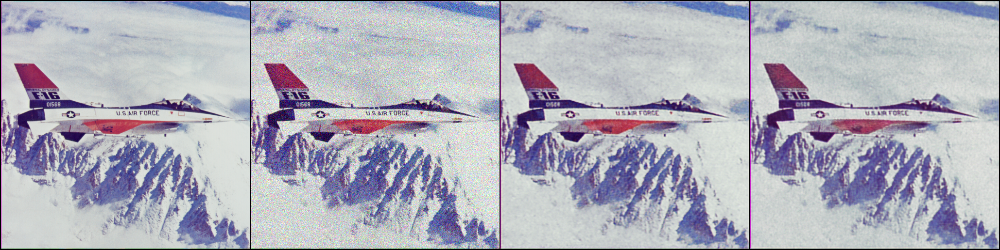

In [163]:
print('The original image',
      '/The corrupted image',
      '/The restored image with optimal iteration number',
     '/The restored image with early stopping approach', sep='')
transforms.ToPILImage()(torchvision.utils.make_grid(torch.cat([img, corrupted_img, restored_img,restored_img_es],
                                                              dim=0),ncol=1,normalize=True))

## Stochastic gradient Langevin dynamics (SGLD) optimization 

Another way to solve the problem of increasing the loss function over iterations is to adopt optimization procedure. In the explanations above we have already mentioned that the goal of deep prior is to evaluate the integral:

$$p(y|\hat{y}) = \int p(y|z,\theta,\hat{y})p(\theta|\hat{y})p(z)dzd\theta$$

Instead of directly solving the integral, we can use the Markov chain Monte Carlo (MCMC) method to estimate the posterior. This involves generating a sequence of correlated samples from the target distribution, which can converge to the true posterior during iterations. However, the MCMC approach can be slow and inefficient, and hence, using gradient-based optimization with noise can be a more effective solution. This involves minimizing the objective function and introducing noise to the gradient updates:

$$\theta_{i+1} = \theta_{i} + \mathrm{lr}\cdot\Delta_{i}^{\mathrm{standard}} + s\cdot\mathrm{lr}\cdot\epsilon$$

where $\Delta_{i}^{\mathrm{standard}}$ standard optimization update, $\mathrm{lr}$ - learning rate, $\epsilon \sim N(0,1)$, $s$ - strength of added noise.

More details of how and why it works described in [paper](https://arxiv.org/pdf/1904.07457.pdf)

### Implement SGLD (5 pts)

1. Take the previous implementation of the optimization procedure and adjust it to add noise to the model parameters after each iteration, but **only for convolutional layers**.
2. Set the strength of added noise to 4.
3. Plot the training convergence with the loss computed for generated and corrupted images.
4. Plot the training convergence with the loss computed for generated and original images.
5. Analyze and explain the results in comparison to the Early Stopping approach.
6. Try different values for the strength of added noise $s$ and comment the results.

In [177]:
def SGLD(model,z,corrupted_img,orig_img,iters,criterion=torch.nn.MSELoss(),reg_noise=0.01, strength=4):
    # your code is here
    model = model.to(device)
    z = z.to(device)
    corrupted_img = corrupted_img.to(device)
    orig_img = orig_img.to(device)
    optimizer = torch.optim.Adam(model.parameters(), lr=0.0001)
    
    lr = 0.0001
    corr_loss = []
    orig_loss = []
    for i in tqdm(range(iters)):
        optimizer.zero_grad()
        noise_z = z + reg_noise * torch.randn(z.shape).to(device)
        output = model(noise_z)
        loss_corr = criterion(output, corrupted_img)
        corr_loss.append(loss_corr.item())
        loss_orig = criterion(output, orig_img)
        orig_loss.append(loss_orig.item())
        loss = loss_corr
        loss.backward()

        layer_list = [model.Encoder, model.bottleneck, model.Decoder, model.last_layer]
        with torch.no_grad():
            for i in range(len(layer_list[0])):
                for layer in model.Encoder[i].model:
                    if isinstance(layer, torch.nn.modules.conv.Conv2d):
                        layer.weight += torch.nn.Parameter(lr * strength * torch.randn(layer.weight.shape).to(layer.weight.device))

            for layer in layer_list[1]:
                if isinstance(layer, torch.nn.modules.conv.Conv2d):
                    layer.weight += torch.nn.Parameter(lr * strength * torch.randn(layer.weight.shape).to(layer.weight.device))

            for i in range(len(layer_list[2])):
                for layer in model.Decoder[i].model:
                    if isinstance(layer, torch.nn.modules.conv.Conv2d):
                          layer.weight += torch.nn.Parameter(lr * strength * torch.randn(layer.weight.shape).to(layer.weight.device))

            for layer in layer_list[3]:
                if isinstance(layer, torch.nn.modules.conv.Conv2d):
                    layer.weight += torch.nn.Parameter(lr * strength * torch.randn(layer.weight.shape).to(layer.weight.device))
                  
        optimizer.step()

    return model, output, corr_loss, orig_loss

100%|███████████████████████████████████████| 3000/3000 [11:35<00:00,  4.31it/s]


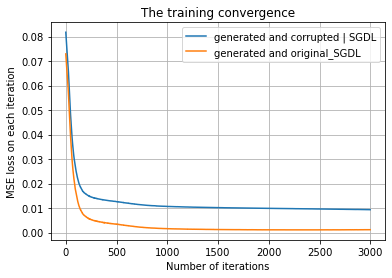

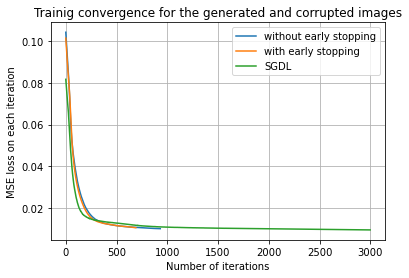

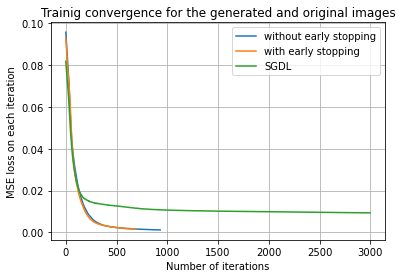

In [170]:
# your code is here
model = Unet(inc=32, outc=3, hidden_size=16)
model, restored_img_sgdl, corr_loss_sgdl, orig_loss_sgdl = SGLD(model, z, corrupted_img, img, iters=3000)

convergence_plot([corr_loss_sgdl, orig_loss_sgdl],
                 ['generated and corrupted | SGDL','generated and original_SGDL'])

convergence_plot([corr_loss, corr_loss_es, corr_loss_sgdl],
                 ['without early stopping', 'with early stopping', 'SGDL'],
                title = 'Trainig convergence for the generated and corrupted images')

convergence_plot([orig_loss, orig_loss_es, corr_loss_sgdl],
                 ['without early stopping', 'with early stopping', 'SGDL'],
                title = 'Trainig convergence for the generated and original images')

**One simple conclusion**

In my case early stopping approach has less MSE on original images and approximately same on corrupted

The original image/The corrupted image
/The restored image with optimal iteration number/The restored image with early stopping approach
/The restored image | SGDL


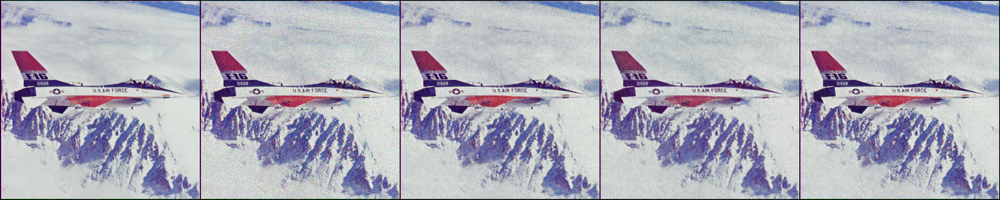

In [175]:
print('The original image',
      '/The corrupted image', sep='')
print('/The restored image with optimal iteration number',
     '/The restored image with early stopping approach', sep='')
print('/The restored image | SGDL', sep='')
transforms.ToPILImage()(torchvision.utils.make_grid(torch.cat([img, corrupted_img,
                                                               restored_img,restored_img_es,restored_img_sgdl],
                                                              dim=0),ncol=1,normalize=True))

### Try different values for the strength of added noise  𝑠 and comment the results.

In [180]:
s = [0.1, 1, 4, 10, 20]

corr_losses_s, orig_losses_s, restored_imgs_s = [], [], []
for strength in s:
    model = Unet(inc=32, outc=3, hidden_size=16)
    model, restored_img_s, corr_loss_s, orig_loss_s = SGLD(model, z, corrupted_img, img,
                                                               iters=3000, strength = strength)
    restored_imgs_s.append(restored_img_s)
    corr_losses_s.append(corr_loss_s)
    orig_losses_s.append(orig_loss_s)

100%|███████████████████████████████████████| 3000/3000 [12:07<00:00,  4.12it/s]


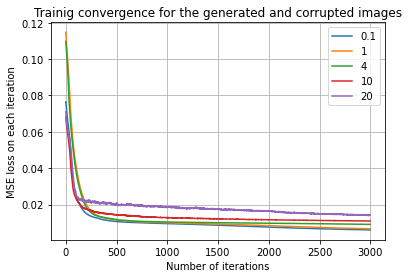

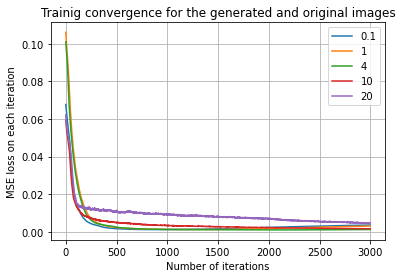

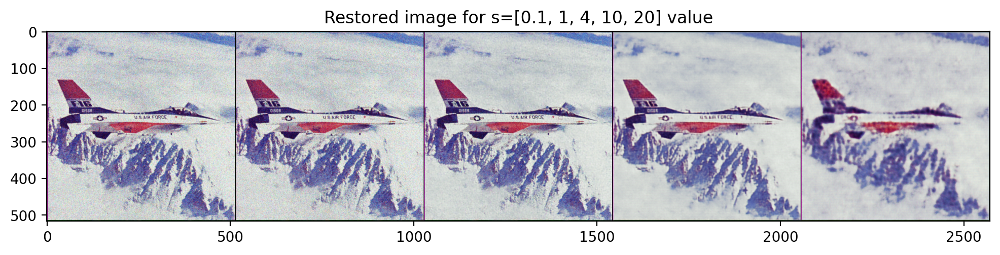

In [195]:
convergence_plot(corr_losses_s,s, title = 'Trainig convergence for the generated and corrupted images')

convergence_plot(orig_losses_s,s, title = 'Trainig convergence for the generated and original images')

# transforms.ToPILImage()(torchvision.utils.make_grid(torch.cat(restored_imgs_s,
#                                                               dim=0),ncol=1,normalize=True))

pic = torchvision.utils.make_grid(torch.cat(restored_imgs_s,dim=0),ncol=1,normalize=True)

plt.figure(figsize=(12,6),dpi = 200)
plt.imshow(pic.permute(1,2,0).detach().cpu().numpy())
plt.title(f'Restored image for s={s} value')
plt.show()

## Inpainting

Deep Image Prior is a versatile tool that can be utilized in solving an important task such as image inpainting. In this task, the challenge lies in the inability to obtain values for the pixels that are damaged and defined by the mask. Thus, during the training process, it is essential to apply the mask to the generated image as these values are unavailable for this particular task. Furthermore, in order to effectively address this issue, you will try a more complex model called AttentionUNet. This model is similar to the UNet model in terms of structure but with the inclusion of attention blocks in the decoder part. 

### Attention block (10 pts)

For AttentionUNet implementation you only need to implement Attention layer. Attention should scale hidden output of encoder block which is also an input for the corresponding decoder block in order to draw more "attention" to particular image parts. Below we have placed the pipeline which you should implement:

**Input:** $skip$ of size [batch,skip_channels,H_skip,W_skip], $x$ of size [batch,x_channels,H_x,W_x]

**Output:** $skip^*$ of size [batch,skip_channels,H_skip,W_skip]

1. Apply 2d convolution with kernel size $2$ to $skip$ to make it of size [batch,skip_channels,H_x,W_x] (recall that 2H_x = H_skip, 2W_x = W_skip)
2. Apply 2d convolution with kernel size $1$ to $x$ to make it of size [batch,skip_channels,H_x,W_x]
3. Sum the outputs of previous two steps and apply ReLU over it.
4. Apply 2d convolution to previous output to reduce channel dimension to 1. So the output should have size equal [batch,1,H_x,W_x]
5. Apply Sigmoid to the previous output to get attention itself
6. Apply attention to the input $skip$ (original block input **NOT** the output of the first step) by simply multipling $skip$ by attention element-wise.

In [23]:
class Attention(torch.nn.Module):
    def __init__(self,skip_channels, x_channels):
        super().__init__()
        # your code is here
        self.conv_skip = torch.nn.Conv2d(skip_channels, skip_channels, kernel_size=1)
        self.conv_x = torch.nn.Conv2d(x_channels, skip_channels, kernel_size=1)
        self.relu = torch.nn.ReLU()
        self.conv_att = torch.nn.Conv2d(skip_channels, 1, kernel_size=1)
        self.sigmoid = torch.nn.Sigmoid()
        self.upsample = torch.nn.ConvTranspose2d(in_channels=x_channels,
                                                 out_channels=x_channels,
                                                 kernel_size=2,
                                                 stride=2)
    def forward(self,skip,x):
        # your code is here
        x = self.upsample(x)
        skip = self.conv_skip(skip)
        x = self.conv_x(x)
        x = self.relu(skip + x)
        att = self.sigmoid(self.conv_att(x))
        skip = skip * att
        return skip

In [50]:
class Decoder_Block_With_Attention(torch.nn.Module):
    def __init__(self,inp_channels,out_channels):
        super().__init__()
        self.upsample = torch.nn.ConvTranspose2d(inp_channels,out_channels,kernel_size=2,stride=2)
        self.model = torch.nn.Sequential(
            torch.nn.Conv2d(inp_channels,out_channels,kernel_size=3,padding=1),
            torch.nn.BatchNorm2d(out_channels),
            torch.nn.ReLU(),
            torch.nn.Conv2d(out_channels,out_channels,kernel_size=3,padding=1),
            torch.nn.BatchNorm2d(out_channels),
            torch.nn.ReLU(),
        )
        self.attention = Attention(out_channels,inp_channels)
    def forward(self,x,enc_x):
        enc_x = self.attention(enc_x,x)
        x = self.upsample(x)
        x = torch.cat([x,enc_x],dim=1)
        return self.model(x)


class AttentionUnet(torch.nn.Module):
    def __init__(self,inc,outc,hidden_size=16):
        super().__init__()
        self.Encoder = torch.nn.ModuleList([
            Encoder_Block(inc,hidden_size),
            Encoder_Block(hidden_size,hidden_size*2),
            Encoder_Block(hidden_size*2,hidden_size*4),
            Encoder_Block(hidden_size*4,hidden_size*8),
])
        self.bottleneck = torch.nn.Sequential(
            torch.nn.Conv2d(hidden_size*8,hidden_size*16,kernel_size=1),
            torch.nn.BatchNorm2d(hidden_size*16),
            torch.nn.ReLU(),
            torch.nn.Conv2d(hidden_size*16,hidden_size*16,kernel_size=1),
            torch.nn.BatchNorm2d(hidden_size*16),
            torch.nn.ReLU()
        )
        self.Decoder = torch.nn.ModuleList([
            Decoder_Block_With_Attention(hidden_size*16,hidden_size*8),
            Decoder_Block_With_Attention(hidden_size*8,hidden_size*4),
            Decoder_Block_With_Attention(hidden_size*4,hidden_size*2),
            Decoder_Block_With_Attention(hidden_size*2,hidden_size*1),
        ])
        self.last_layer = torch.nn.Sequential(
            torch.nn.Conv2d(hidden_size,outc,kernel_size=3,padding="same"),
            torch.nn.Sigmoid()
        )
    def forward(self,x):
        encs = []
        for module in self.Encoder:
            x, enc = module(x)
            encs.append(enc)
        encs = encs[::-1]
        x = self.bottleneck(x)
        for idx, module in enumerate(self.Decoder):
            x = module(x,encs[idx])
        return self.last_layer(x)

In [42]:
transform = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(256),
    transforms.ToTensor()
])

In [43]:
img = transform(Image.open("./data/inpainting/library.png"))[None].to(device)
img_mask = transform(Image.open("./data/inpainting/library_mask.png"))[None].to(device)
corrupted_img = img * img_mask

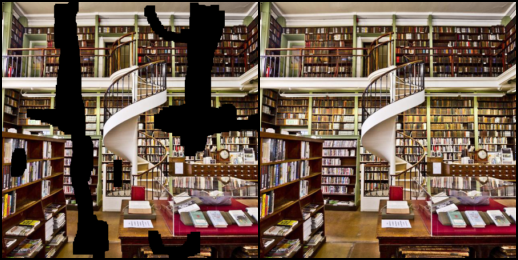

In [44]:
transforms.ToPILImage()(torchvision.utils.make_grid(torch.cat([corrupted_img,img],dim=0),nrow=2,normalize=True))

### Modify SGLD optimization (6 pts):
1. Take the code for SGLD and update loss calculation by applying mask to generated image (take $s$ = 4, lr = $4 \cdot 10^{-4}$, reg_noise = $0.2$, iters=$2000$)
2. Run the code and evaluate how well model fitted to known pixels and restore the missed one
3. Run the same code with standard UNet model and compare results with AttentionUNet. What conclusion can you make?


**Bonus task (4 pts)** Try to find optimal hyper parameters (strength of added noise $s$, learning rate, reg_noise, number of iterations)

In [105]:
def optimization_inpainting(model, z, corrupted_img, mask, orig_img, iters, criterion=torch.nn.MSELoss(), reg_noise=0.2, strength=4, lr=4e-4):
    model = model.to(device)
    z = z.to(device)
    corrupted_img = corrupted_img.to(device)
    mask = mask.to(device)
    orig_img = orig_img.to(device)
    optimizer = torch.optim.Adam(model.parameters(), lr=lr)

    corr_loss = []
    orig_loss = []
    for i in tqdm(range(iters)):
        optimizer.zero_grad()
        noise_z = z + reg_noise * torch.randn(z.shape).to(z.device)
        output = model(noise_z)
        output_masked = output * mask
        corr_loss_item = criterion(output_masked, corrupted_img)
        corr_loss.append(corr_loss_item.item())
        orig_loss_item = criterion(output_masked, orig_img)
        orig_loss.append(orig_loss_item.item())
        loss = corr_loss_item
        loss.backward()

        layer_list = [model.Encoder, model.bottleneck, model.Decoder, model.last_layer]
        with torch.no_grad():
            for i in range(len(layer_list[0])):
                for layer in model.Encoder[i].model:
                    if isinstance(layer, torch.nn.modules.conv.Conv2d):
                        layer.weight += torch.nn.Parameter(lr * strength * torch.randn(layer.weight.shape).to(layer.weight.device))

            for layer in layer_list[1]:
                if isinstance(layer, torch.nn.modules.conv.Conv2d):
                    layer.weight += torch.nn.Parameter(lr * strength * torch.randn(layer.weight.shape).to(layer.weight.device))

            for i in range(len(layer_list[2])):
                for layer in model.Decoder[i].model:
                    if isinstance(layer, torch.nn.modules.conv.Conv2d):
                        layer.weight += torch.nn.Parameter(lr * strength * torch.randn(layer.weight.shape).to(layer.weight.device))

            for layer in layer_list[3]:
                if isinstance(layer, torch.nn.modules.conv.Conv2d):
                    layer.weight += torch.nn.Parameter(lr * strength * torch.randn(layer.weight.shape).to(layer.weight.device))

        optimizer.step()

    return model, output, corr_loss, orig_loss, corr_loss[-1]

In [106]:
nc = 2
model_without_attention = Unet(nc,3,hidden_size=16).to(device)
z = torch.cat(torch.meshgrid(torch.arange(img.size(2))/img.size(2),torch.arange(img.size(3))/img.size(3))).reshape(1,2,img.size(2),img.size(3)).to(device)

In [107]:
# your code is here
model_without_attention, without_attention_out, corr_loss_without_attention, orig_loss_without_attention, ls1 = optimization_inpainting(model_without_attention, z, 
                                                                                                             corrupted_img, img_mask, img, iters=2000, reg_noise=0.2)

100%|███████████████████████████████████████| 2000/2000 [03:02<00:00, 10.95it/s]


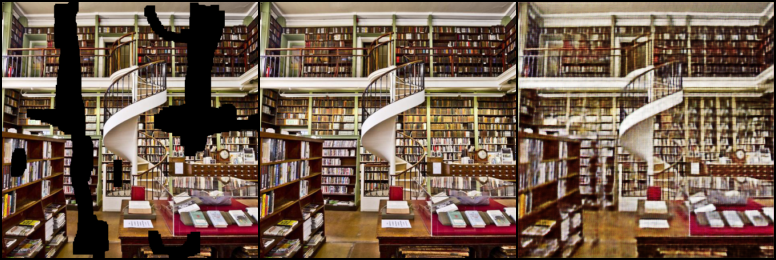

In [108]:
transforms.ToPILImage()(torchvision.utils.make_grid(torch.cat([corrupted_img,
                                                               img,
                                                               without_attention_out],dim=0),nrow=3,normalize=True))

In [109]:
nc = 2
model_with_attention = AttentionUnet(nc,3,hidden_size=16).to(device)
z = torch.cat(torch.meshgrid(torch.arange(img.size(2))/img.size(2),torch.arange(img.size(3))/img.size(3))).reshape(1,2,img.size(2),img.size(3)).to(device)

In [110]:
# your code is here
model_with_attention, with_attention_out, corr_loss_with_attention, orig_loss_with_attention, ls = optimization_inpainting(model_with_attention, z,
                                                                                                                       corrupted_img, img_mask,
                                                                                                                       img, iters=2000, reg_noise=0.2)

100%|███████████████████████████████████████| 2000/2000 [04:10<00:00,  7.99it/s]


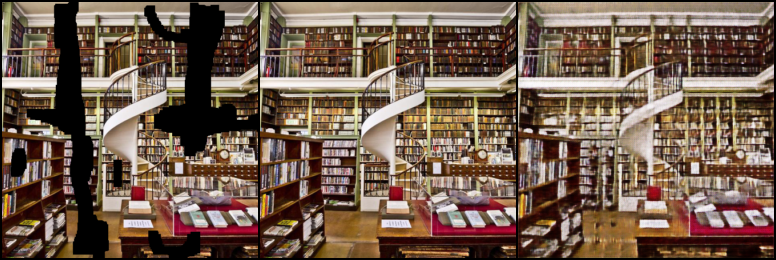

In [111]:
transforms.ToPILImage()(torchvision.utils.make_grid(torch.cat([corrupted_img,
                                                               img,
                                                               with_attention_out],dim=0),nrow=3,normalize=True))

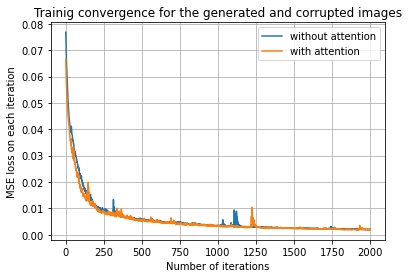

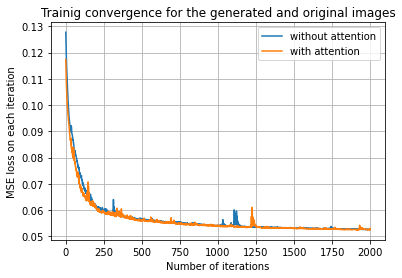

In [112]:
convergence_plot([corr_loss_without_attention, corr_loss_with_attention],
                 ['without attention','with attention'],
                 title = 'Trainig convergence for the generated and corrupted images')

convergence_plot([orig_loss_without_attention, orig_loss_with_attention],
                 ['without attention','with attention'],
                 title = 'Trainig convergence for the generated and original images')

### Bonus task. Grid search

In [96]:
import itertools

s_values = [0.1, 1.0, 10]
learning_rates = [0.001, 0.0001]
reg_noises = [0.01,  0.1]
num_iterations = [500, 1000, 2000]

hyperparameter_grid = itertools.product(s_values, learning_rates, reg_noises, num_iterations)

best_loss = float('inf')
best_hyperparams = None

for s, learning_rate, reg_noise, n_iter in hyperparameter_grid:
    _,_,_,_, loss = optimization_inpainting(model_without_attention,
                                            z, corrupted_img, img_mask, img,
                                            iters=n_iter, reg_noise=reg_noise, strength = s, lr=learning_rate)

    if loss < best_loss:
        best_loss = loss
        best_hyperparams = (s, learning_rate, reg_noise, n_iter)

print(f"Best hyperparameters found: s={best_hyperparams[0]}, learning_rate={best_hyperparams[1]}, reg_noise={best_hyperparams[2]}, num_iterations={best_hyperparams[3]}")


100%|███████████████████████████████████████| 2000/2000 [03:51<00:00,  8.63it/s]

Best hyperparameters found: s=0.1, learning_rate=0.001, reg_noise=0.1, num_iterations=2000


## Problem 3. Natural language generation (35 pts)

This problem requires uploading two csv files along with the solution notebook. Please compress these three files in zip archive and upload it in Canvas. 

Natural language generation (NLG) is a well-known research problem concerned with generating textual descriptions of structured data, such as tables, as output. Compared to machine translation, where the goal is to completely convert an input sentence into another language, NLG requires overcoming two different challenges: deciding what to say, by selecting a relevant subset of the input data to describe, and deciding how to say it, by generating text that flows and reads naturally. 

In this task you will need to generate table descriptions and titles for the dataset that can be downloaded from the [link](https://box.skoltech.ru/index.php/s/DRfJFNUJMgmLxOU). Your inference pipeline should receive `.csv` and output 2 strings: table description `text` and table title `title`.

As the solution to this task you shoud complete `submission.csv` and `submission_reranking.csv` files as below and report the link on your finetuned checkpoints.

In [114]:
import pandas as pd

data = pd.read_csv('./dataset_nlg_v1/train.csv', index_col=0)
data.head(5)

,text,title
871923758931292416,This statistic presents the global revenue of ...,Omnicom Group 's revenue from 2006 to 2019 ( i...
12713542298181105208,This statistic shows the number of hotel and s...,Number of hotel and similar accommodation esta...
5796511258704617257,"In 2019 , just 2.5 percent of all private wage...",Unemployment rate in the U.S. broadcasting ind...
14629703118053421010,This statistic displays the benefits of using ...,If a â€œconnected deviceâ€ ? had the following...
14801098692472737046,The statistic shows global gross domestic prod...,Global gross domestic product ( GDP ) at curre...


In [115]:
sample = pd.read_csv('./dataset_nlg_v1/data/10000577178717490723.csv', index_col=0)
sample

,Industry,Real value added in billion chained (2012) U.S. dollars
0,"Finance, insurance, real estate, rental, and l...",64.12
1,Professional and business services,51.64
2,Government and government enterprises,38.29
3,Manufacturing,24.58
4,"Educational services, health care, and social ...",24.30
5,Information,21.97
6,"Mining, quarrying, and oil and gas extraction",19.43
7,Wholesale trade,19.07
8,Retail trade,18.55
9,Construction,16.51


In [116]:
submission = pd.read_csv('./dataset_nlg_v1/submission.csv', index_col=0)
submission.head(5)

,text,title
223685202396506,NaN,NaN
223685202396505,NaN,NaN
223685202396504,NaN,NaN
223685202396503,NaN,NaN
223685202396502,NaN,NaN


- (**5 pts**) Propose and implement at least 2 variants of the input data preprocessing from tables to string data.
- (**5 pts**) Fine-tune [T5](https://huggingface.co/docs/transformers/model_doc/t5) as a baseline using `t5-base` checkpoint ([paper](https://arxiv.org/pdf/1910.10683.pdf)). In order to handle 2 types of output, test usage of prefixes for T5 model.
- (**5 pts**) Propose and implement at least 2 variants of data augmentation, retune T5 and compare performance.
- (**5 pts**) Add domain adoptation via additional Masked language modeling loss (MLM, [paper, section 3.1, Task #1](https://arxiv.org/pdf/1810.04805.pdf)) loss term for encoder, provide hyperparameter search for the regularization parameter $\lambda$, use BERTScore as objective, compare performance:
$$L(x, y) = -LogLikelihood(x, y) + \lambda L_{MLM}(x_{masked}, x)$$


The following metrics should be reported:
- [SacreBLEU](https://github.com/mjpost/sacrebleu)
- [ROUGEL](https://github.com/google-research/google-research/tree/master/rouge)
- [METEOR](https://www.nltk.org/_modules/nltk/translate/meteor_score.html)
- [BERTScore](https://github.com/Tiiiger/bert_score) using `bert-base-uncased` checkpoint and 9th layer output

Using the best checkpoint from above prepare submission file `submission.csv`, where index is a table caption from the `data` folder, and report the link on your finetuned checkpoint.

## (5 pts) Propose and implement at least 2 variants of the input data preprocessing from tables to string data.

In [117]:
import csv

dataset = []
for filename in tqdm(data.index):
    with open(f'./dataset_nlg_v1/data/{filename}.csv', 'r') as input_file:
        reader = csv.reader(input_file)
        new_string = []
        for row in reader:
            new_string.append(row)
    csv_string = ""
    for row in new_string:
        csv_string += ",".join(row) + "\n"
    dataset.append(csv_string)
    
dataset[0]

100%|██████████████████████████████████| 25321/25321 [00:01<00:00, 15414.63it/s]


',Year,Revenue in billion U.S. dollars\n0,2019,14.95\n1,2018,15.29\n2,2017,15.27\n3,2016,15.42\n4,2015,15.13\n5,2014,15.32\n6,2013,14.58\n7,2012,14.22\n8,2011,13.87\n9,2010,12.54\n10,2009,11.72\n11,2008,13.36\n12,2007,12.69\n13,2006,11.38\n'

In [118]:
dataset2 = []

for filename in tqdm(data.index):
    df = pd.read_csv(f'./dataset_nlg_v1/data/{filename}.csv')
    csv_string = df.to_csv(index=False)
    dataset2.append(csv_string)
dataset2[0]

100%|████████████████████████████████████| 25321/25321 [00:55<00:00, 458.97it/s]


'Unnamed: 0,Year,Revenue in billion U.S. dollars\n0,2019,14.95\n1,2018,15.29\n2,2017,15.27\n3,2016,15.42\n4,2015,15.13\n5,2014,15.32\n6,2013,14.58\n7,2012,14.22\n8,2011,13.87\n9,2010,12.54\n10,2009,11.72\n11,2008,13.36\n12,2007,12.69\n13,2006,11.38\n'

## Reranking approach (15 pts)

Using maximum likelihood, an ideal model will assign all probability mass to the reference summary. During inference, the model must also generate the output based on possibly erroneous previous steps. This can affect the performance of the model, a phenomenon often called exposure bias. One way to solve this problem is to require our model to be able to accurately predict the ranking order of a set of most likely candidates via an additional contrastive loss term

$$L(x, y) = -LogLikelihood(x, y) + L_{contrastive}(x, y)$$

where

$$
L_{contrastive}(x, y) = \sum_i\sum_{j < i}\max(0, f(s_i(x)) - f(s_j(x)) + \alpha_{ij})
$$

where $\alpha_{ij} = \alpha \cdot (i - j)$ is a margin, $s_i$ and $s_j$ are different candidates (generated by [beam search](https://huggingface.co/blog/how-to-generate)) such that for selected ranking function $r$ $r(s_j, y) > r(s_i, y)$, and 
$f(s)$ is a length-normalised estimated log-probability:

$$
f(s) = \frac{\sum_{t} LogProb(s_t| s_{<t}, x)}{|x|},
$$

where $|x|$ is a lenght of $x$.

Your task is to fine-tune the model with reranking-aware loss using BERTScore as the ranking function $r$, provide hyperparameter search for the margin scaling factor $\alpha$ using BERTScore as objective, report metrics for the best case (SacreBLEU, ROUGEL, METEOR, BERTScore), and prepare the submission file `submission_reranking.csv` and report the link on your finetuned checkpoint.

In [ ]:
# Your code is here